# Evaluation of performance measurements with different traffic metrics and various shell size

Shells:

    1. Starlink Gen 2 Shell 1 - 5280
    2. Kuiper Shell 3 - 784
    3. OneWeb Shell 1 - 1764

With:

    1. High population TM
    2. High GDP population TM
    3. Country capital TM
    4. Global flight TM

In [6]:
import matplotlib.pyplot as plt
import pandas as pd

plt.rcParams["figure.figsize"] = (21, 9)
plt.rcParams.update({'font.size': 45})


def plot_th(xlabel, xaxis, GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df):

    GDPPOP_df['throughput_Gbps'] = GDPPOP_df['throughput_Gbps']/1000
    ONLYPOP_df['throughput_Gbps'] = ONLYPOP_df['throughput_Gbps']/1000
    CONTRYCAP_df['throughput_Gbps'] = CONTRYCAP_df['throughput_Gbps']/1000
    FLIGHT_df['throughput_Gbps'] = FLIGHT_df['throughput_Gbps']/1000

    fig, ax1 = plt.subplots()
    # ax1.set_xticks(x_label_ticks, minor=False)
    ax1.xaxis.grid(True, which='major')
    ax1.xaxis.grid(True, which='minor')
    ax1.tick_params(axis='y')
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel('Throughput (Tbps)')

    ax1.plot(GDPPOP_df[xaxis], GDPPOP_df['throughput_Gbps'],
             label='High GDP population', color='orange', linewidth=7)
    ax1.plot(ONLYPOP_df[xaxis], ONLYPOP_df['throughput_Gbps'],
             label='High population', color='g', linewidth=9, linestyle='dashdot')
    ax1.plot(CONTRYCAP_df[xaxis], CONTRYCAP_df['throughput_Gbps'],
             label='Country capital', color='r', linewidth=10, linestyle='dotted')
    ax1.plot(FLIGHT_df[xaxis], FLIGHT_df['throughput_Gbps'],
             label='Global flight', color='b', linewidth=9, linestyle='dashed')

    ax1.legend(framealpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_cov(xlabel, xaxis, df_pop_gdp, df_country_cap, df_flight):
    fig, ax1 = plt.subplots()
    # ax1.set_xticks(x_label_ticks, minor=False)
    ax1.xaxis.grid(True, which='major')
    ax1.xaxis.grid(True, which='minor')
    ax1.tick_params(axis='y')
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel('Coverage metrics')

    ax1.plot(df_pop_gdp[xaxis], df_pop_gdp['GS_coverage_metric'],
             label='Most populous city', color='r', linewidth=10, linestyle='dotted')
    ax1.plot(df_country_cap[xaxis], df_country_cap['GS_coverage_metric'],
             label='Country capital', color='g', linewidth=9, linestyle='dashed')
    ax1.plot(df_flight[xaxis], df_flight['flight_coverage_metric'],
             label='Flight', color='b', linewidth=7)

    ax1.legend(framealpha=0.3)
    plt.tight_layout()
    plt.show()


def sth_h(df):
    x_line = [h for h in range(300, 2000+1, 250)]
    x_line.append(2000)
    # Stretch
    fig, ax1 = plt.subplots()
    ax1.set_xticks(x_line, minor=False)
    ax1.xaxis.grid(True, which='major')
    ax1.xaxis.grid(True, which='minor')
    ax1.set_xticklabels(ax1.get_xticks(), rotation=10)

    ax1.set_xlabel('Altitude (h) km')
    ax1.set_ylabel('Median stretch')
    line1 = ax1.plot(df['S0_h_km'], df['EW_sth'], label='EW',
                     color='Red', linewidth=8, linestyle='dotted')
    line2 = ax1.plot(df['S0_h_km'], df['NESW_sth'], label='NESW',
                     color='Purple', linewidth=9, linestyle='dashdot')
    line4 = ax1.plot(df['S0_h_km'], df['HG_sth'], label='HG',
                     color='Green', linewidth=5, linestyle='solid', marker='X', ms=15)
    line3 = ax1.plot(df['S0_h_km'], df['NS_sth'], label='NS',
                     color='Blue', linewidth=7, linestyle='dashed')

    ax1.tick_params(axis='y')
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    # we already handled the x-label with ax1
    ax2.tick_params(axis='y', labelcolor='Orange')
    ax2.set_ylabel('LG median stretch', color='Orange')

    line5 = ax2.plot(df['S0_h_km'], df['LG_sth'], label='LG',
                     color='Orange', linewidth=7, linestyle='dashed')
    ax2.tick_params(axis='y')

    lines = line1+line2+line3+line4+line5
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels)
    fig.tight_layout()
    plt.show()


def hop_h(df):
    x_line = [h for h in range(300, 2000+1, 250)]
    x_line.append(2000)

    # Hop count
    fig, ax1 = plt.subplots()
    ax1.set_xticks(x_line, minor=False)
    ax1.xaxis.grid(True, which='major')
    ax1.xaxis.grid(True, which='minor')
    ax1.set_xticklabels(ax1.get_xticks(), rotation=10)

    ax1.set_xlabel("Altitude (h) km")
    ax1.set_ylabel("Median hop count")

    line1 = ax1.plot(df['S0_h_km'], df['NS_cnt'], label='NS',
                     color='Blue', linewidth=7, linestyle='dashed')
    line2 = ax1.plot(df['S0_h_km'], df['EW_cnt'], label='EW',
                     color='Red', linewidth=8, linestyle='dotted')
    line4 = ax1.plot(df['S0_h_km'], df['NESW_cnt'], label='NESW',
                     color='Purple', linewidth=9, linestyle='dashdot')
    line3 = ax1.plot(df['S0_h_km'], df['LG_cnt'], label='LG',
                     color='Orange', linewidth=7, linestyle='dashed')

    ax2 = ax1.twinx()
    ax2.set_ylabel('HG median hop count', color='Green')
    ax2.tick_params(axis='y', labelcolor='Green')
    line5 = ax2.plot(df['S0_h_km'], df['HG_cnt'], label='HG',
                     color='Green', linewidth=5, linestyle='solid', marker='X', ms=15)

    lines = line1+line2+line3+line4+line5
    labels = [l.get_label() for l in lines]

    plt.legend(lines, labels)
    fig.tight_layout()
    plt.show()


def sth_i(df):
    x_line = [i for i in range(0, 90+1, 20)]
    fig, ax1 = plt.subplots()

    ax1.set_xticks(x_line, minor=False)
    ax1.xaxis.grid(True, which='major')
    ax1.xaxis.grid(True, which='minor')
    ax1.set_xlabel('Inclination (i) in degree')
    ax1.set_ylabel('Median stretch')
    line1 = ax1.plot(df['S0_i'], df['EW_sth'], label='EW',
                     color='Red',  linewidth=8, linestyle='dotted')
    line2 = ax1.plot(df['S0_i'], df['NESW_sth'], label='NESW',
                     color='Purple', linewidth=9, linestyle='dashdot')
    line4 = ax1.plot(df['S0_i'], df['HG_sth'], label='HG', color='Green',
                     linewidth=5, linestyle='solid', marker='X', ms=23)
    line5 = ax1.plot(df['S0_i'], df['LG_sth'], label='LG',
                     color='Orange', linewidth=6)
    ax1.tick_params(axis='y')
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    # we already handled the x-label with ax1
    # ax2.set_ylabel('NS median stretch')

    ax2.set_ylabel('NS median stretch', color='Blue')
    ax2.tick_params(axis='y', labelcolor='Blue')

    line3 = ax2.plot(df['S0_i'], df['NS_sth'], label='NS',
                     color='Blue', linewidth=7, linestyle='dashed')
    ax2.tick_params(axis='y')
    fig.tight_layout()
    lines = line1+line2+line3+line4+line5
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, ncol=2)
    plt.tight_layout()
    plt.show()


def hop_i(df):
    x_line = [i for i in range(0, 90+1, 20)]

    _, ax = plt.subplots()
    ax.set_xticks(x_line, minor=False)
    ax.xaxis.grid(True, which='major')
    ax.xaxis.grid(True, which='minor')
    plt.xlabel("Inclination (i) in degree")
    plt.ylabel("Median hop count")
    plt.plot(df['S0_i'], df['NS_cnt'], label='NS',
             color='Blue', linewidth=7, linestyle='dashed')
    plt.plot(df['S0_i'], df['EW_cnt'], label='EW',
             color='Red', linewidth=8, linestyle='dotted')
    plt.plot(df['S0_i'], df['NESW_cnt'], label='NESW',
             color='Purple', linewidth=9, linestyle='dashdot')
    plt.plot(df['S0_i'], df['HG_cnt'], label='HG', color='Green',
             linewidth=5, linestyle='solid', marker='X', ms=23)
    plt.plot(df['S0_i'], df['LG_cnt'], label='LG', color='Orange', linewidth=6)
    plt.legend(loc=4)
    plt.tight_layout()
    plt.show()


def sth_e(df):
    x_line = [e for e in range(5, 50+1, 5)]
    fig, ax1 = plt.subplots()
    ax1.set_xticks(x_line, minor=False)
    ax1.xaxis.grid(True, which='major')
    ax1.xaxis.grid(True, which='minor')
    ax1.set_xlabel('Angle of elevation (e) in degree')
    ax1.set_ylabel('Median stretch')
    line1 = ax1.plot(df['S0_e'], df['EW_sth'], label='EW',
                     color='Red', linewidth=8, linestyle='dotted')
    line2 = ax1.plot(df['S0_e'], df['NESW_sth'], label='NESE',
                     color='Purple', linewidth=9, linestyle='dashdot')
    line4 = ax1.plot(df['S0_e'], df['HG_sth'], label='HG', color='Green',
                     linewidth=5, linestyle='solid', marker='X', ms=23)
    line3 = ax1.plot(df['S0_e'], df['NS_sth'], label='NS',
                     color='Blue', linewidth=7, linestyle='dashed')
    line5 = ax1.plot(df['S0_e'], df['LG_sth'], label='LG',
                     color='Orange', linewidth=6)
    fig.tight_layout()
    lines = line1+line2+line3+line4+line5
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels)
    plt.tight_layout()
    plt.show()


def hop_e(df):
    x_line = [e for e in range(5, 50+1, 5)]
    _, ax = plt.subplots()
    ax.set_xticks(x_line, minor=False)
    ax.xaxis.grid(True, which='major')
    ax.xaxis.grid(True, which='minor')
    plt.xlabel("Angle of elevation (e) in degree")
    plt.ylabel("Median hop count")
    plt.plot(df['S0_e'], df['NS_cnt'], label='NS',
             color='Blue', linewidth=7, linestyle='dashed')
    plt.plot(df['S0_e'], df['EW_cnt'], label='EW',
             color='Red', linewidth=8, linestyle='dotted')
    plt.plot(df['S0_e'], df['NESW_cnt'], label='NESW',
             color='Purple', linewidth=9, linestyle='dashdot')
    plt.plot(df['S0_e'], df['HG_cnt'], label='HG', color='Green',
             linewidth=5, linestyle='solid', marker='X', ms=23)
    plt.plot(df['S0_e'], df['LG_cnt'], label='LG', color='Orange', linewidth=6)
    plt.legend()
    plt.tight_layout()
    plt.show()

## Altitude (h)

In [7]:
starlink_5280_GDPPOP = '../with_ground_stations/POP_GDP_100/Starlink_Shell_1_5280/h_300_2000.csv'
starlink_5280_ONLYPOP = '../with_ground_stations/TOP_POP_100/Starlink_Shell_1_5280/h_300_2000.csv'
starlink_5280_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/Starlink_Shell_1_5280/h_300_2000.csv'
starlink_5280_FLIGHT = '../with_flights/300Kbps/Starlink_Shell_1_5280/h_300_2000.csv'

kuiper_784_GDPPOP = '../with_ground_stations/POP_GDP_100/Kuiper_Shell_3_784/h_300_2000.csv'
kuiper_784_ONLYPOP = '../with_ground_stations/TOP_POP_100/Kuiper_Shell_3_784/h_300_2000.csv'
kuiper_784_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/Kuiper_Shell_3_784/h_300_2000.csv'
kuiper_784_FLIGHT = '../with_flights/300Kbps/Kuiper_Shell_3_784/h_300_2000.csv'

oneweb_1764_GDPPOP = '../with_ground_stations/POP_GDP_100/OneWeb_Shell_1_1764/h_300_2000.csv'
oneweb_1764_ONLYPOP = '../with_ground_stations/TOP_POP_100/OneWeb_Shell_1_1764/h_300_2000.csv'
oneweb_1764_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/OneWeb_Shell_1_1764/h_300_2000.csv'
oneweb_1764_FLIGHT = '../with_flights/300Kbps/OneWeb_Shell_1_1764/h_300_2000.csv'

Throughput with different TMs

Starlink


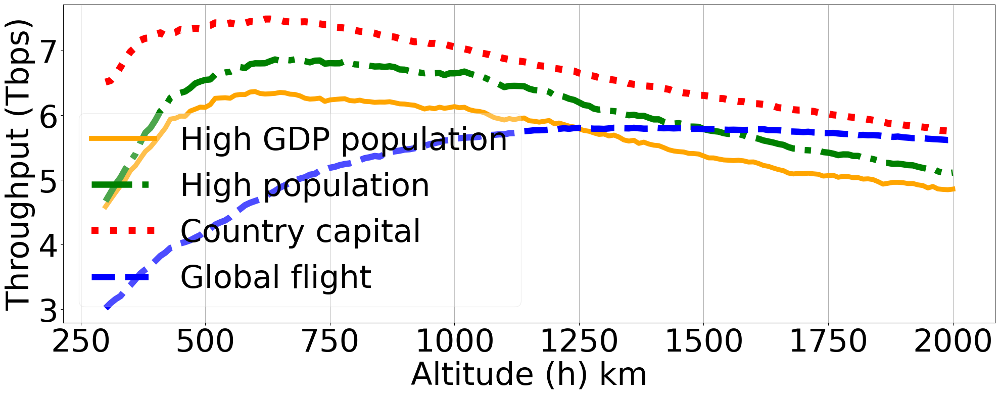

Kuiper


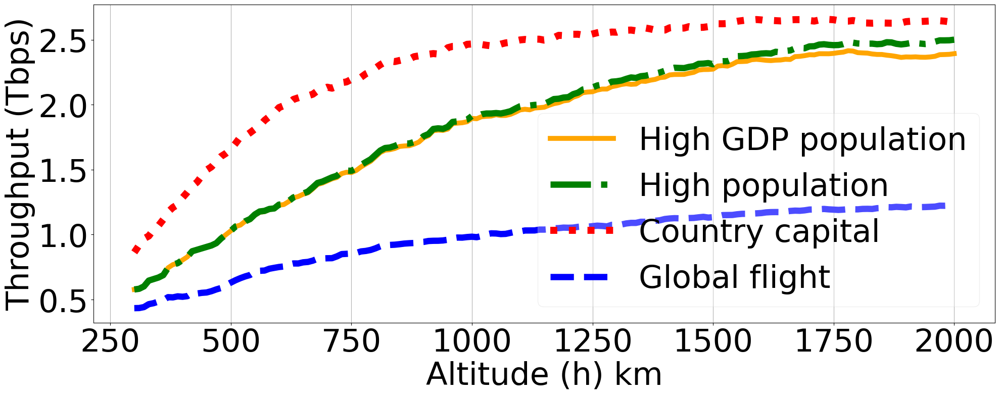

OneWeb


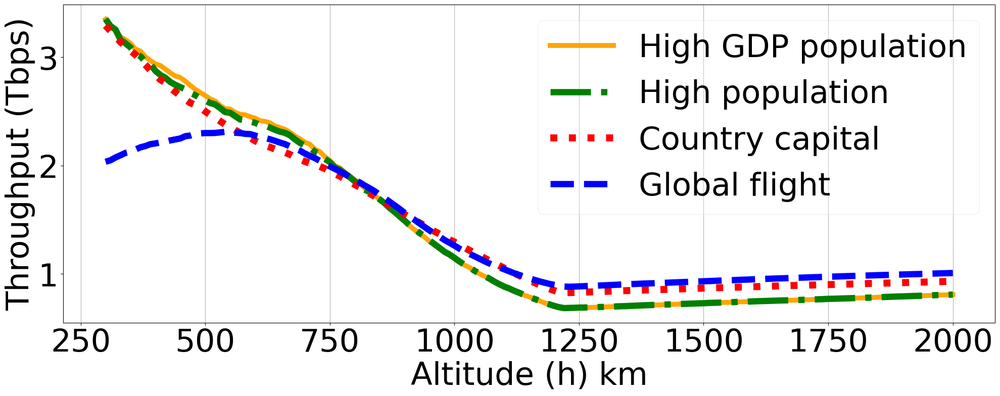

In [8]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_h_km')
plot_th('Altitude (h) km', 'S0_h_km', GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df)

print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_h_km')
plot_th('Altitude (h) km', 'S0_h_km',GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df)

print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_h_km')
plot_th('Altitude (h) km', 'S0_h_km',GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df)

Coverage with different GSes

Starlink


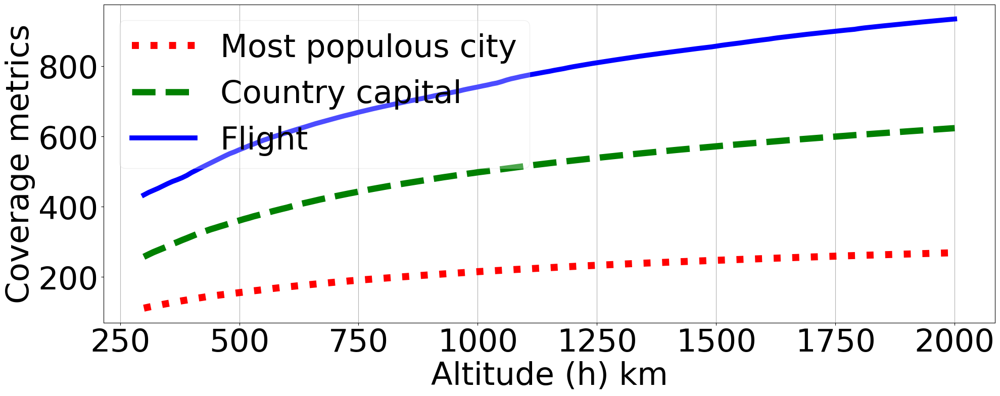

Kuiper


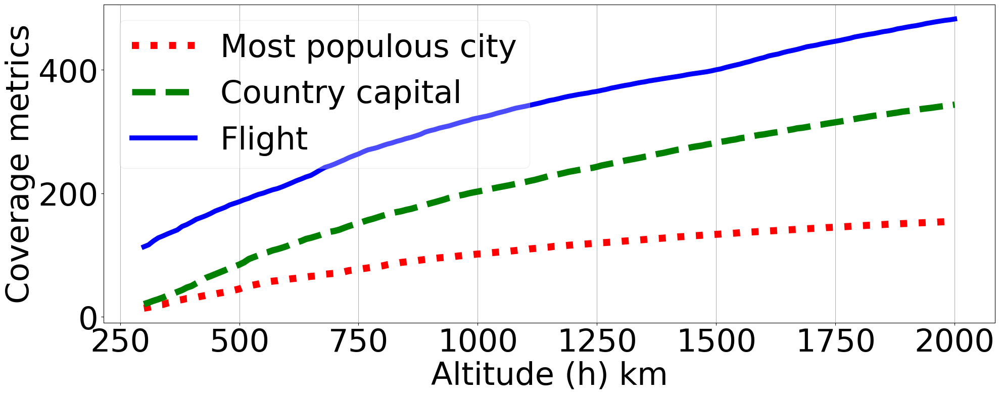

OneWeb


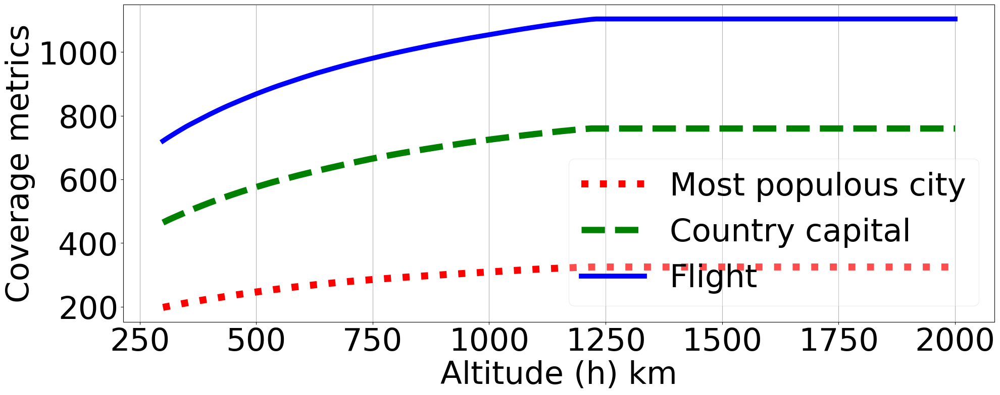

In [9]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_h_km')
plot_cov('Altitude (h) km', 'S0_h_km',GDPPOP_df,CONTRYCAP_df,FLIGHT_df)


print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_h_km')
plot_cov('Altitude (h) km', 'S0_h_km',GDPPOP_df,CONTRYCAP_df,FLIGHT_df)


print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_h_km')
plot_cov('Altitude (h) km', 'S0_h_km',GDPPOP_df,CONTRYCAP_df,FLIGHT_df)

Stretch across different GSes

Starlink
TOP 100


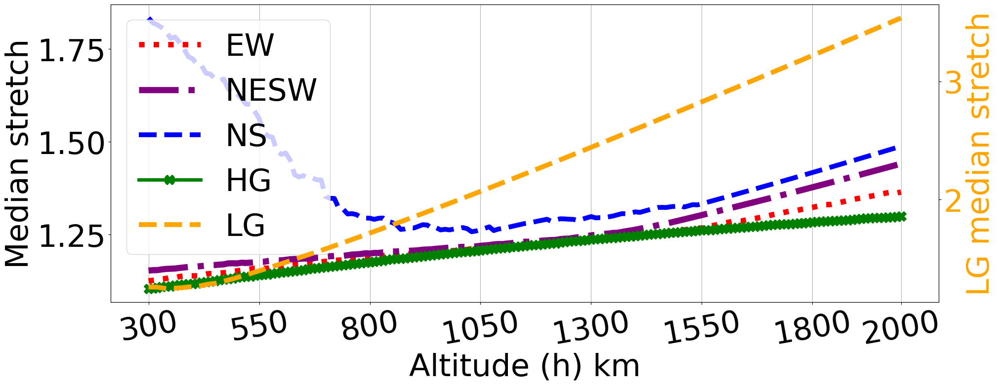

Contry CAP


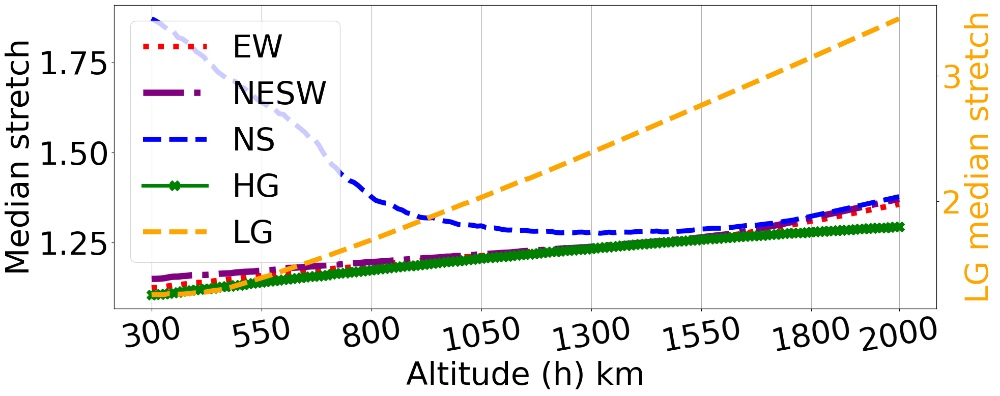

Flight


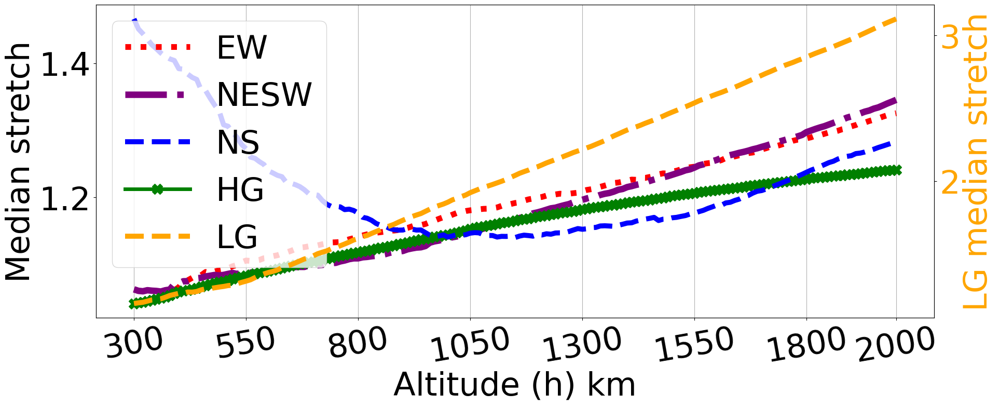

Kuiper
TOP 100


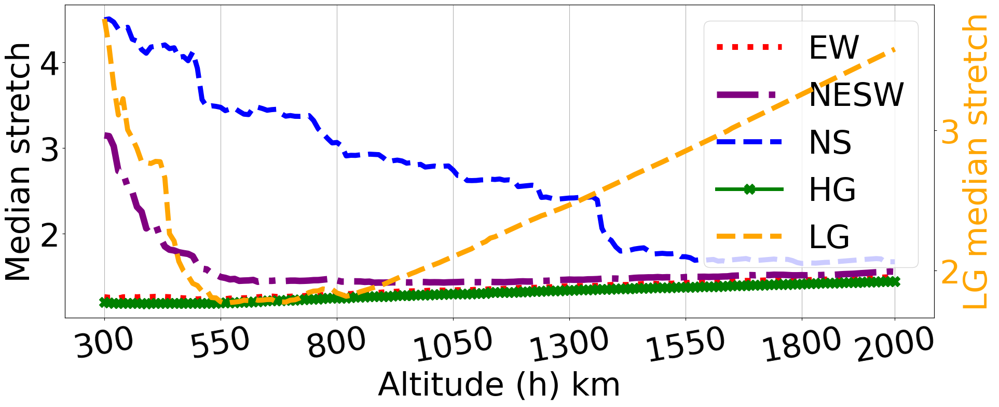

Country CAP


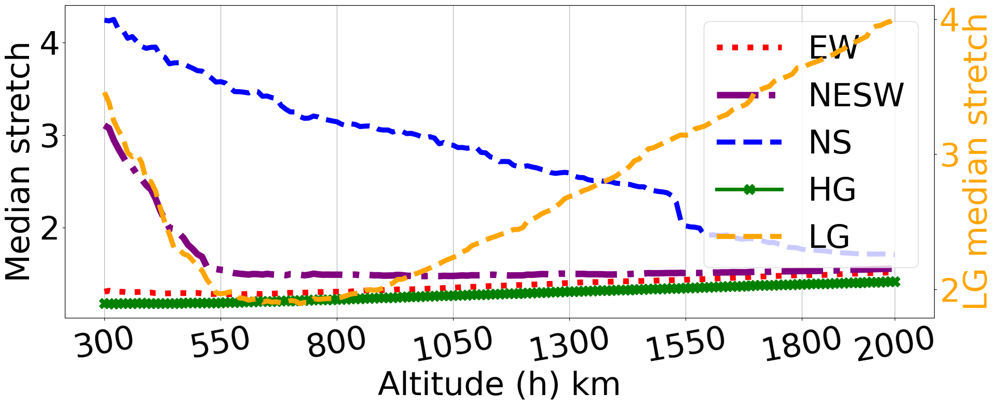

Flight


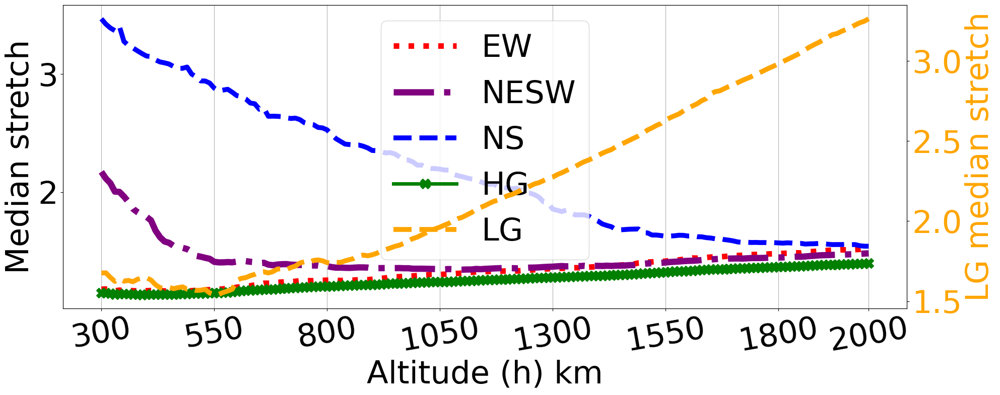

OneWeb
TOP 100


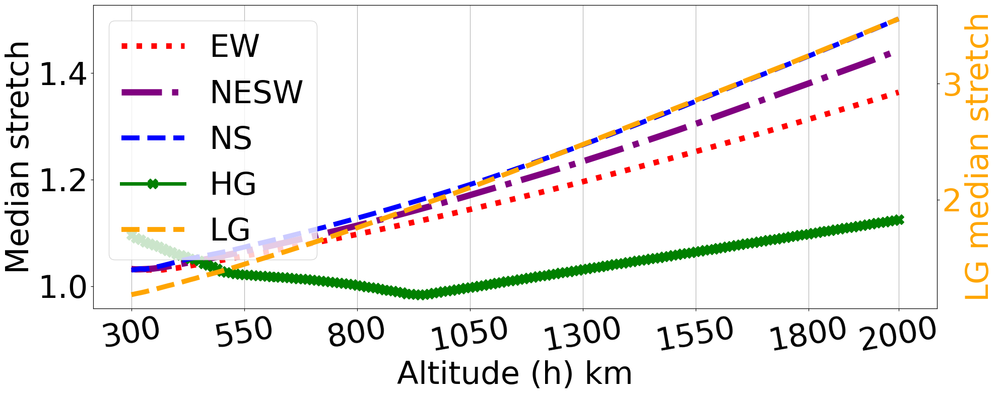

Contry CAP


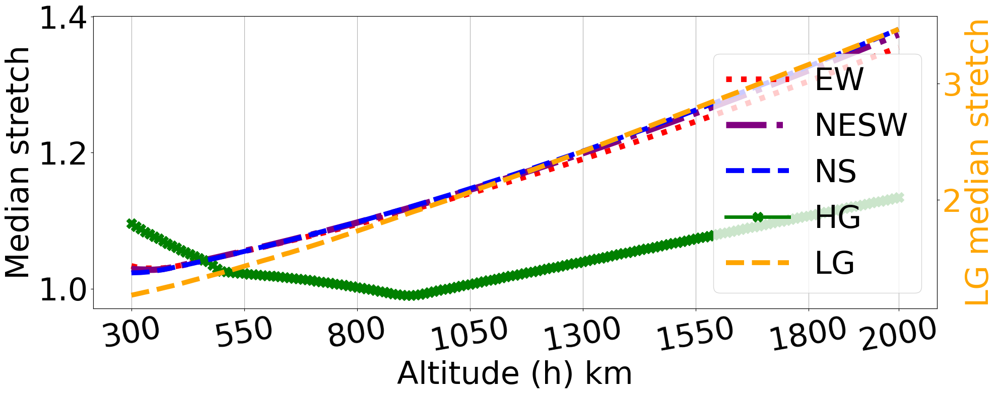

Flight


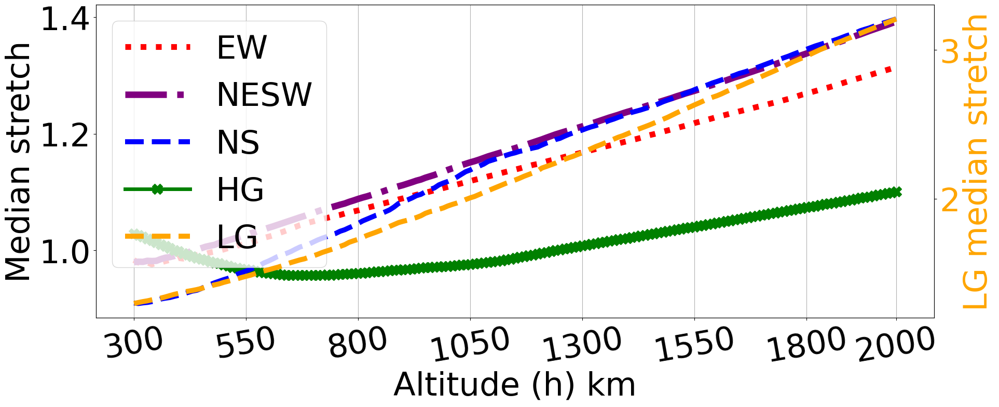

In [10]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_h_km')
print('TOP 100')
sth_h(GDPPOP_df)
print('Contry CAP')
sth_h(CONTRYCAP_df)
print('Flight')
sth_h(FLIGHT_df)


print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_h_km')
print('TOP 100')
sth_h(GDPPOP_df)
print('Country CAP')
sth_h(CONTRYCAP_df)
print('Flight')
sth_h(FLIGHT_df)


print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_h_km')
print('TOP 100')
sth_h(GDPPOP_df)
print('Contry CAP')
sth_h(CONTRYCAP_df)
print('Flight')
sth_h(FLIGHT_df)

Hop count across different GSes

Starlink
TOP 100


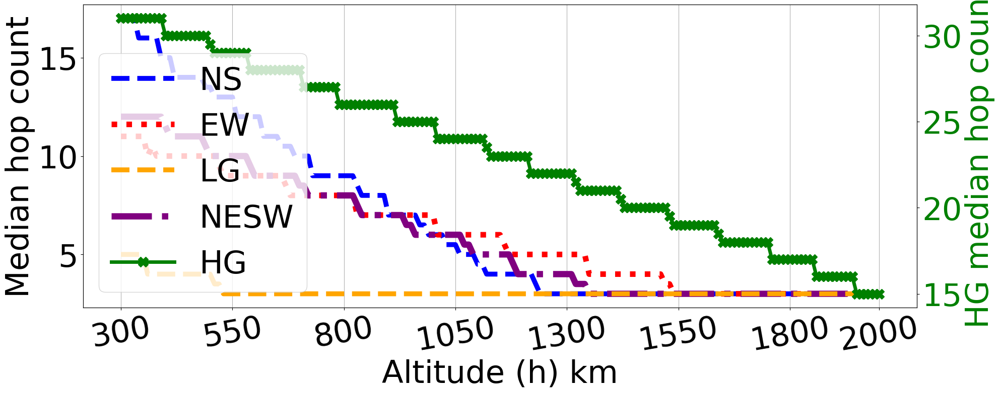

Contry CAP


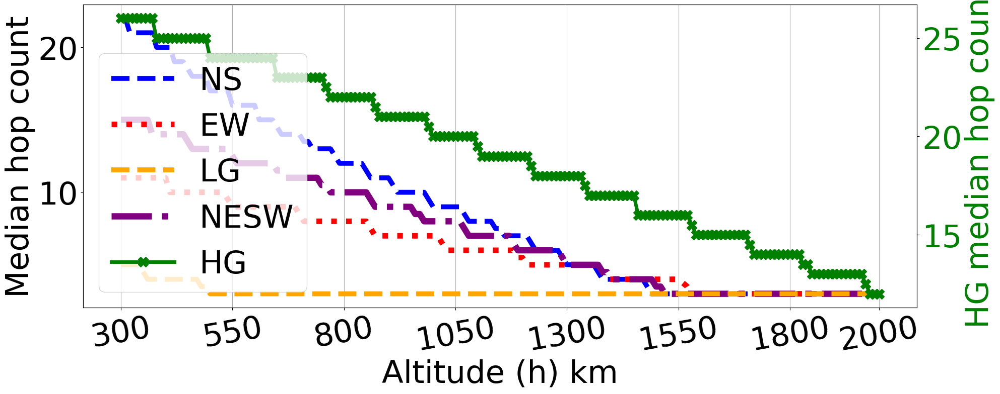

Flight


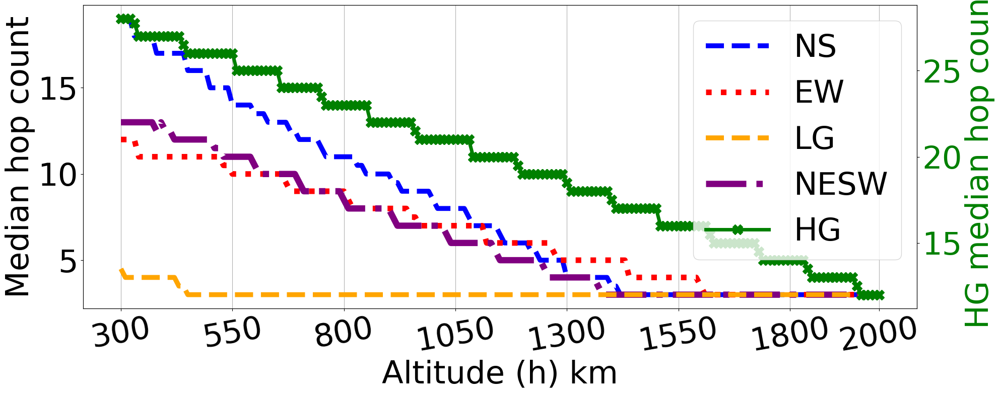

Kuiper
TOP 100


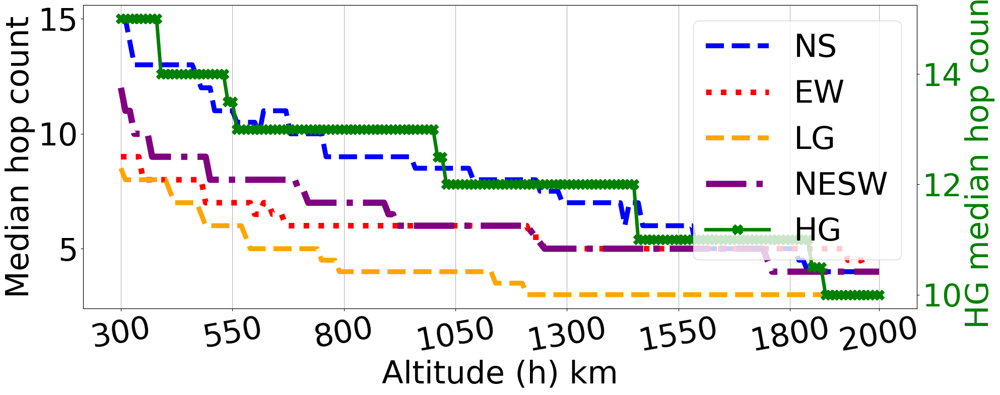

Country CAP


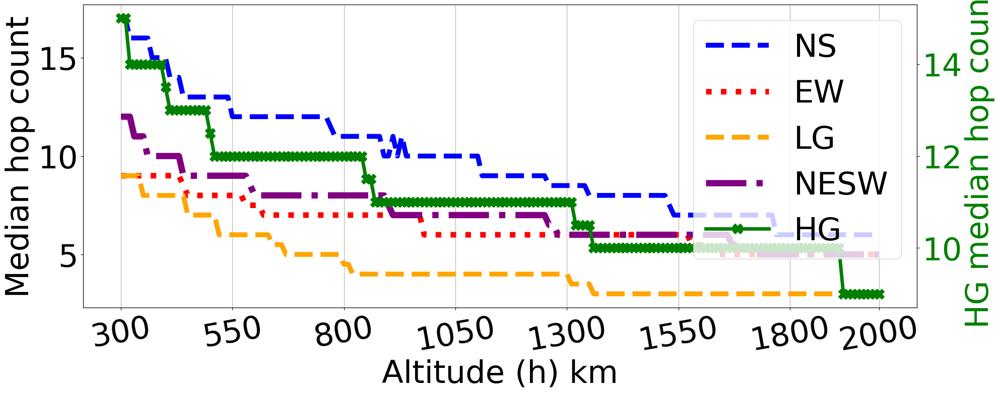

Flight


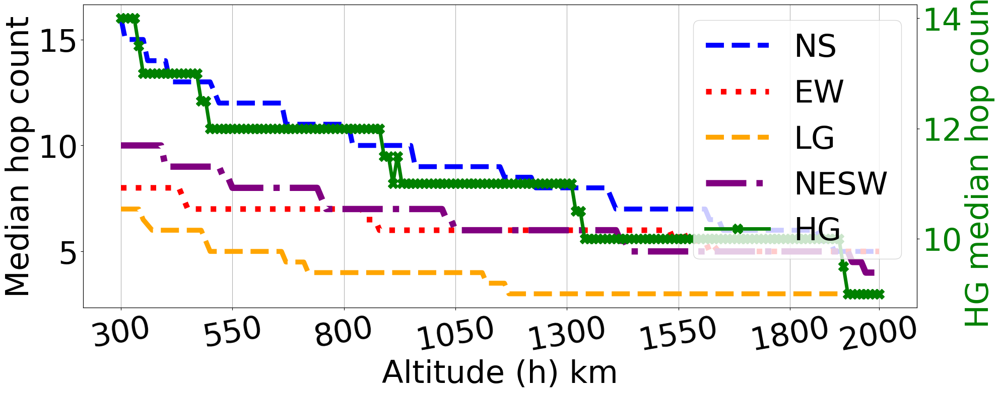

OneWeb
TOP 100


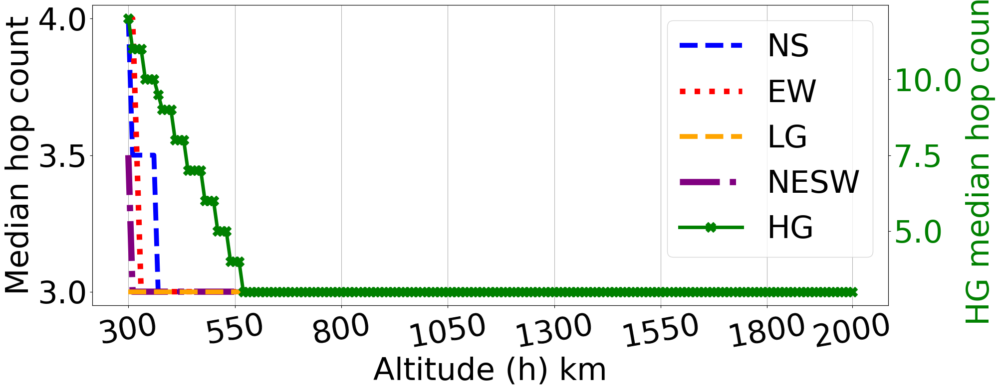

Contry CAP


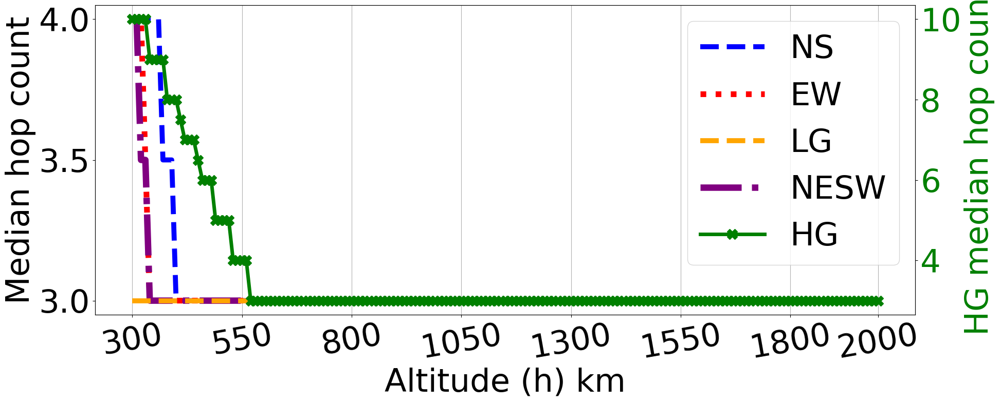

Flight


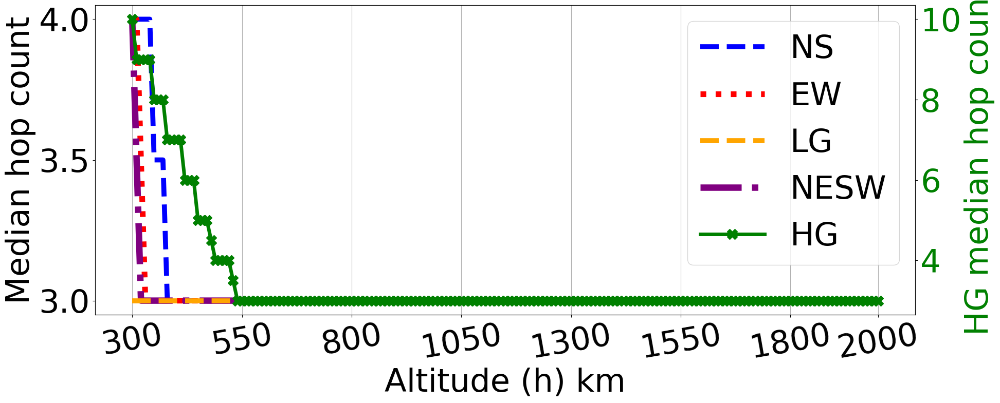

In [11]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_h_km')
print('TOP 100')
hop_h(GDPPOP_df)
print('Contry CAP')
hop_h(CONTRYCAP_df)
print('Flight')
hop_h(FLIGHT_df)


print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_h_km')
print('TOP 100')
hop_h(GDPPOP_df)
print('Country CAP')
hop_h(CONTRYCAP_df)
print('Flight')
hop_h(FLIGHT_df)


print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_h_km')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_h_km')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_h_km')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_h_km')
print('TOP 100')
hop_h(GDPPOP_df)
print('Contry CAP')
hop_h(CONTRYCAP_df)
print('Flight')
hop_h(FLIGHT_df)

## Inclination (i)

In [15]:
starlink_5280_GDPPOP = '../with_ground_stations/POP_GDP_100/Starlink_Shell_1_5280/i_5_90.csv'
starlink_5280_ONLYPOP = '../with_ground_stations/TOP_POP_100/Starlink_Shell_1_5280/i_5_90.csv'
starlink_5280_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/Starlink_Shell_1_5280/i_5_90.csv'
starlink_5280_FLIGHT = '../with_flights/300Kbps/Starlink_Shell_1_5280/i_5_90.csv'

kuiper_784_GDPPOP = '../with_ground_stations/POP_GDP_100/Kuiper_Shell_3_784/i_5_90.csv'
kuiper_784_ONLYPOP = '../with_ground_stations/TOP_POP_100/Kuiper_Shell_3_784/i_5_90.csv'
kuiper_784_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/Kuiper_Shell_3_784/i_5_90.csv'
kuiper_784_FLIGHT = '../with_flights/300Kbps/Kuiper_Shell_3_784/i_5_90.csv'

oneweb_1764_GDPPOP = '../with_ground_stations/POP_GDP_100/OneWeb_Shell_1_1764/i_5_90.csv'
oneweb_1764_ONLYPOP = '../with_ground_stations/TOP_POP_100/OneWeb_Shell_1_1764/i_5_90.csv'
oneweb_1764_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/OneWeb_Shell_1_1764/i_5_90.csv'
oneweb_1764_FLIGHT = '../with_flights/300Kbps/OneWeb_Shell_1_1764/i_5_90.csv'

Throughput with different TMs

Starlink


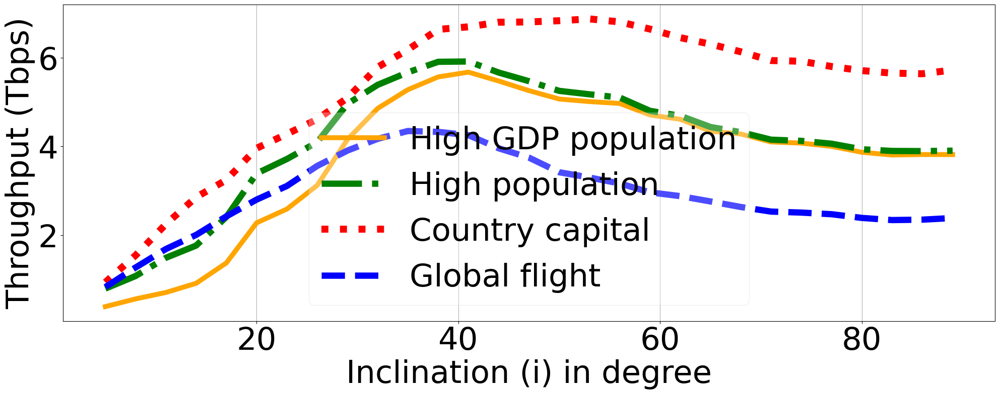

Kuiper


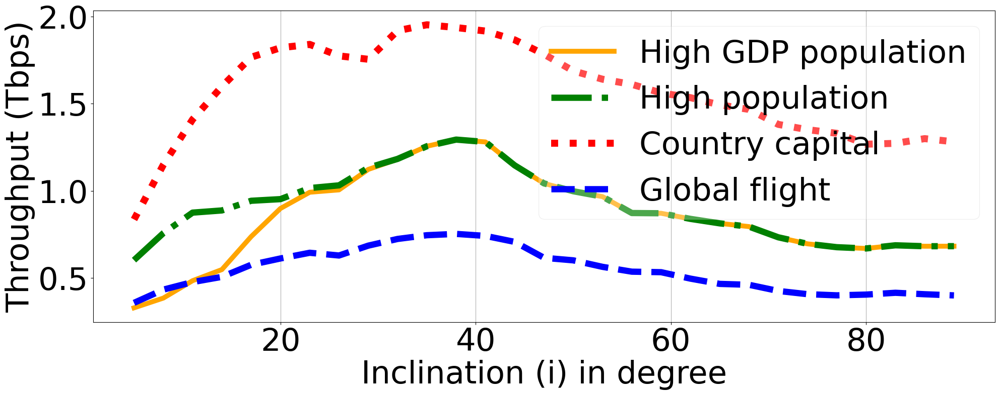

OneWeb


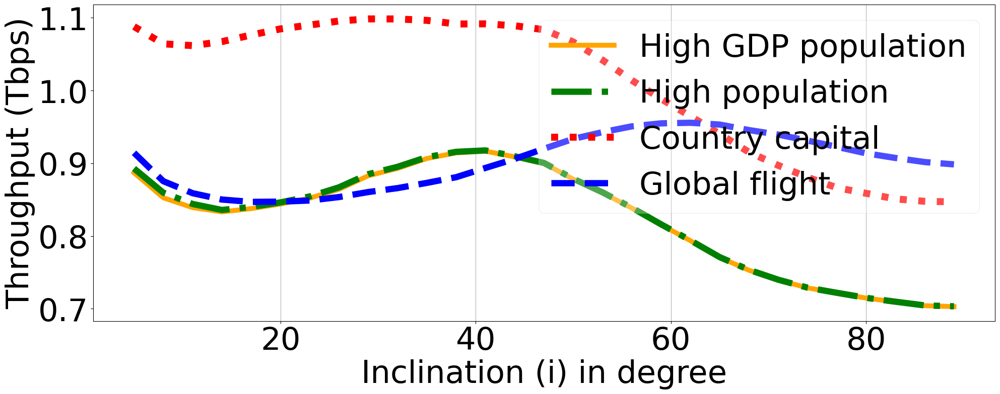

In [16]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_i')
plot_th('Inclination (i) in degree', 'S0_i', GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df)

print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_i')
plot_th('Inclination (i) in degree', 'S0_i',GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df)

print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_i')
plot_th('Inclination (i) in degree', 'S0_i',GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df)

Coverage with different GSes

Starlink


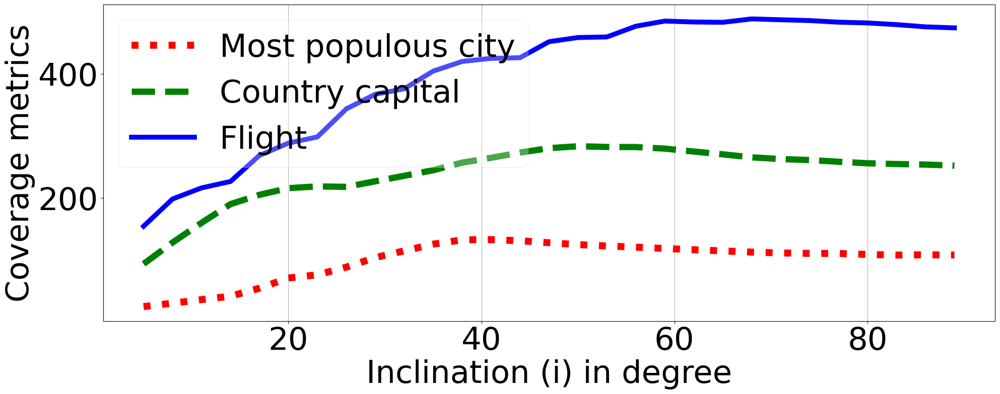

Kuiper


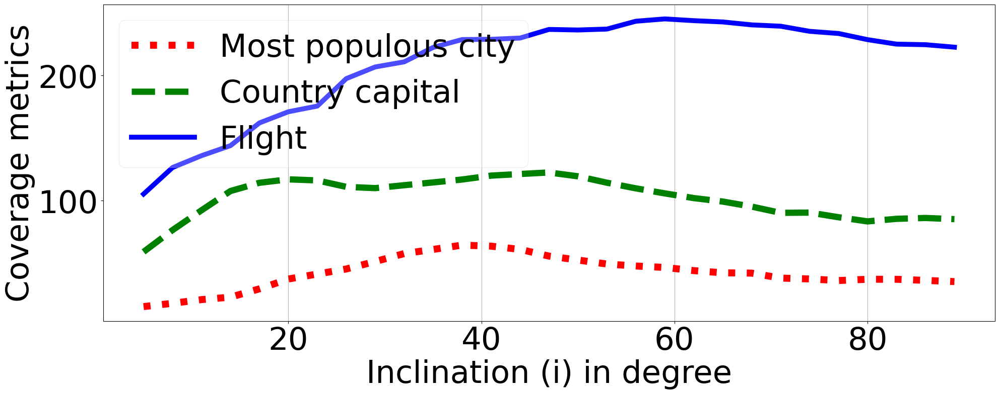

OneWeb


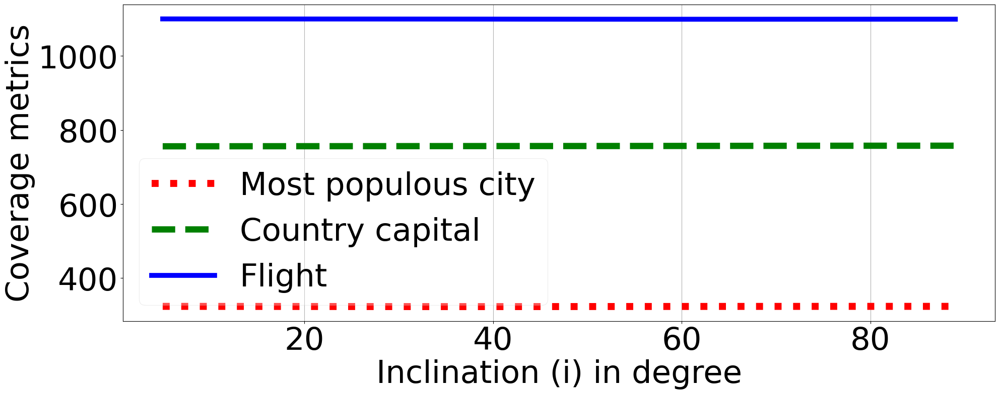

In [17]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_i')
plot_cov('Inclination (i) in degree', 'S0_i',GDPPOP_df,CONTRYCAP_df,FLIGHT_df)
# plt.plot(ONLYPOP_df['S0_i'], ONLYPOP_df['GS_coverage_metric'])
# plt.plot(CONTRYCAP_df['S0_i'], CONTRYCAP_df['GS_coverage_metric'])
# plt.plot(FLIGHT_df['S0_i'], FLIGHT_df['flight_coverage_metric'])


print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_i')
plot_cov('Inclination (i) in degree', 'S0_i',GDPPOP_df,CONTRYCAP_df,FLIGHT_df)
# plt.plot(ONLYPOP_df['S0_i'], ONLYPOP_df['GS_coverage_metric'])
# plt.plot(CONTRYCAP_df['S0_i'], CONTRYCAP_df['GS_coverage_metric'])
# plt.plot(FLIGHT_df['S0_i'], FLIGHT_df['flight_coverage_metric'])


print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_i')
plot_cov('Inclination (i) in degree', 'S0_i',GDPPOP_df,CONTRYCAP_df,FLIGHT_df)
# plt.plot(GDPPOP_df['S0_i'], GDPPOP_df['GS_coverage_metric'])
# plt.plot(CONTRYCAP_df['S0_i'], CONTRYCAP_df['GS_coverage_metric'])
# plt.plot(FLIGHT_df['S0_i'], FLIGHT_df['flight_coverage_metric'])

Stretch across different GSes

Starlink
TOP 100


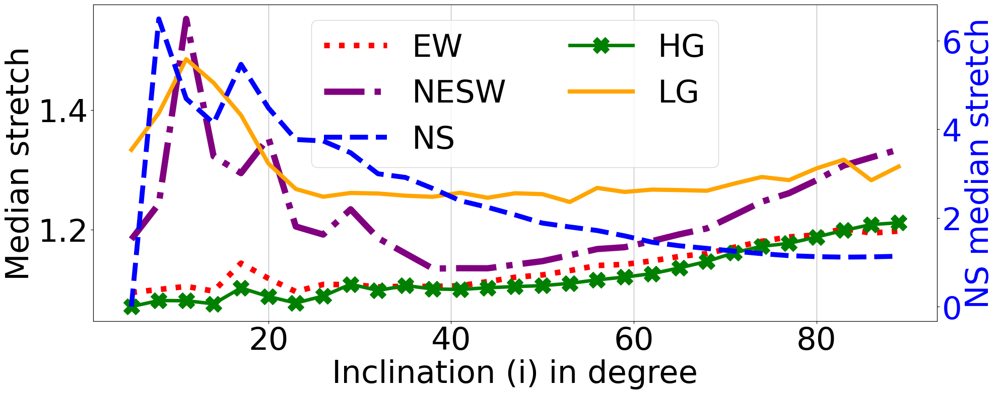

Contry CAP


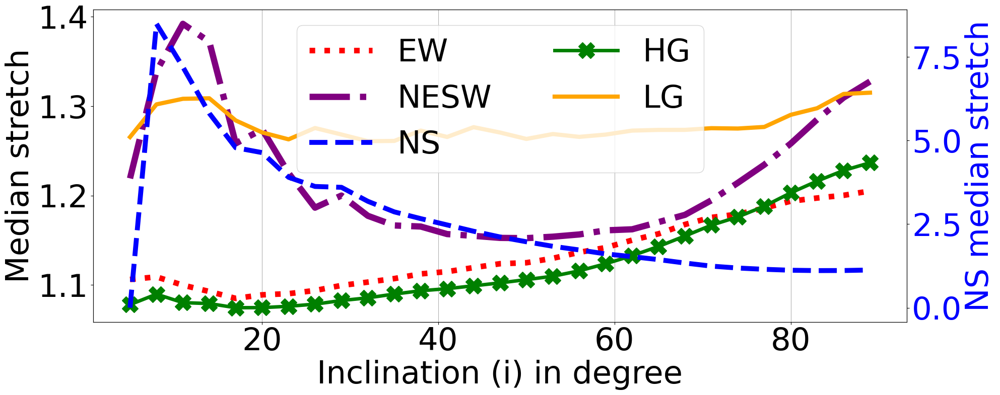

Flight


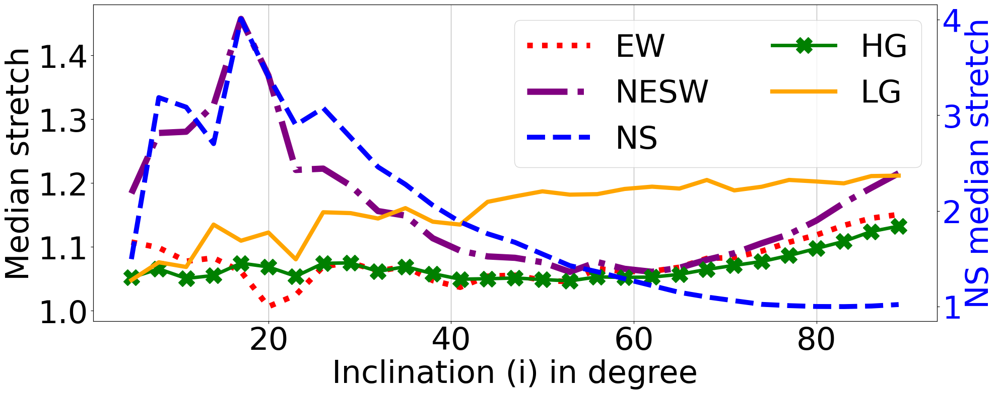

Kuiper
TOP 100


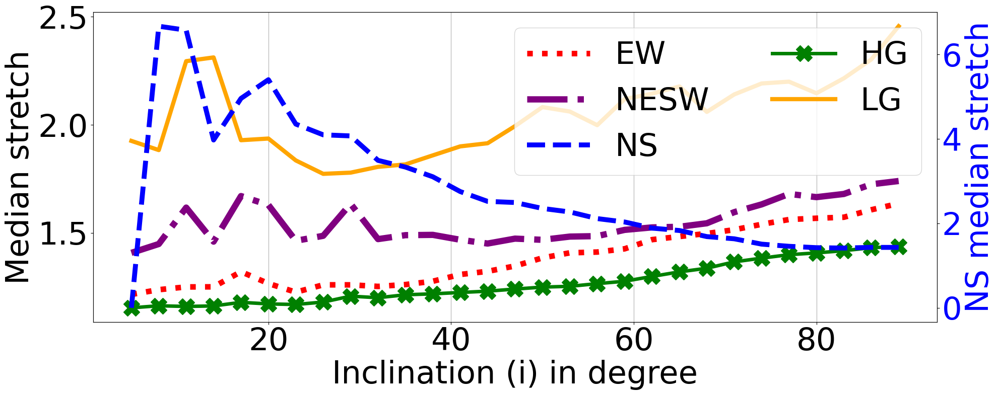

Country CAP


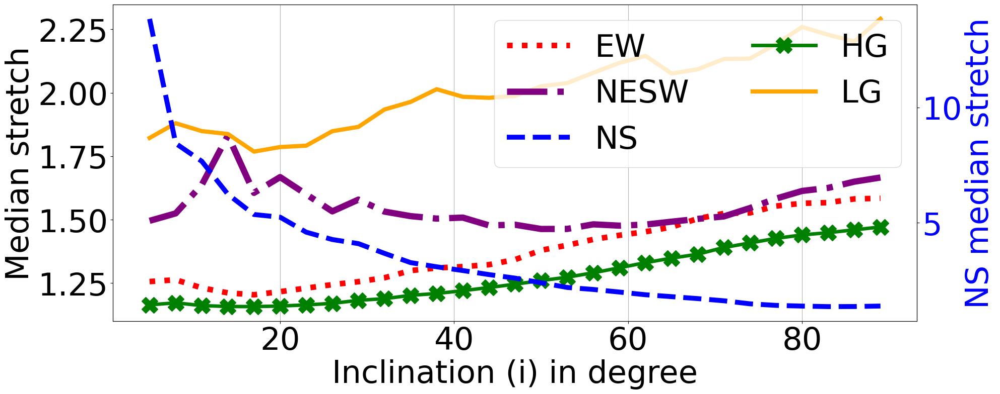

Flight


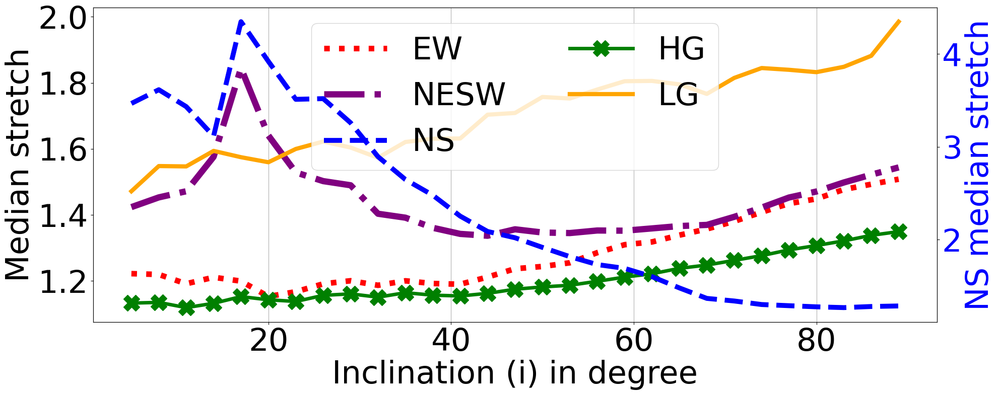

OneWeb
TOP 100


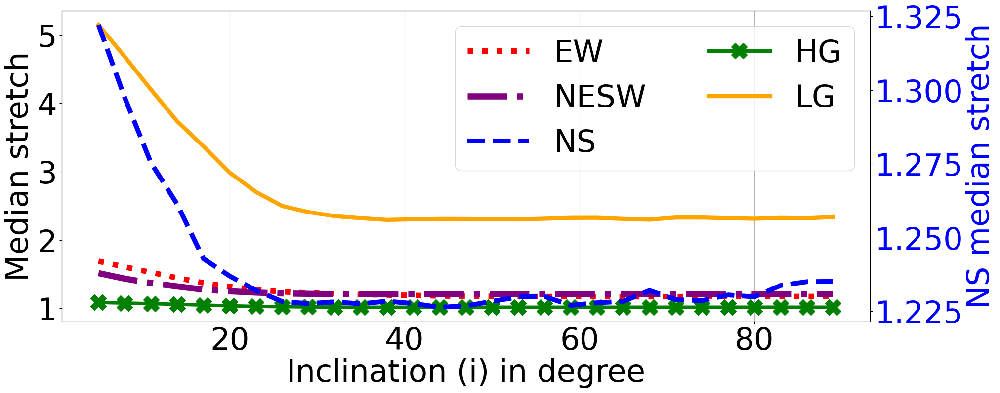

Contry CAP


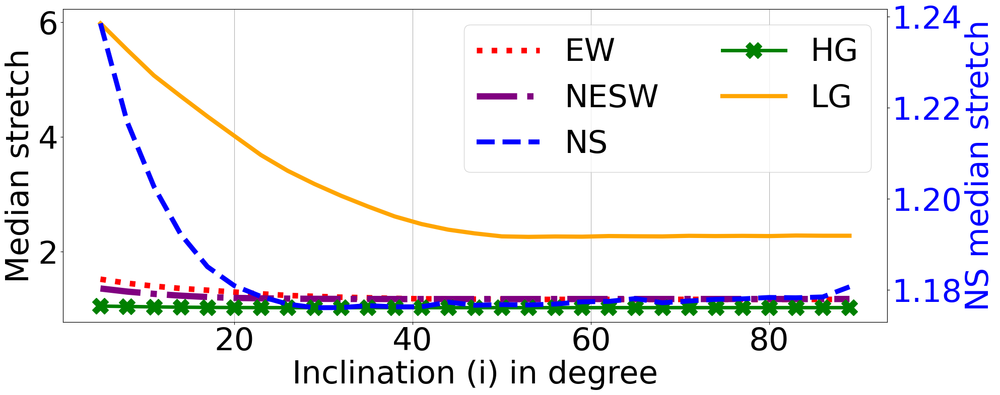

Flight


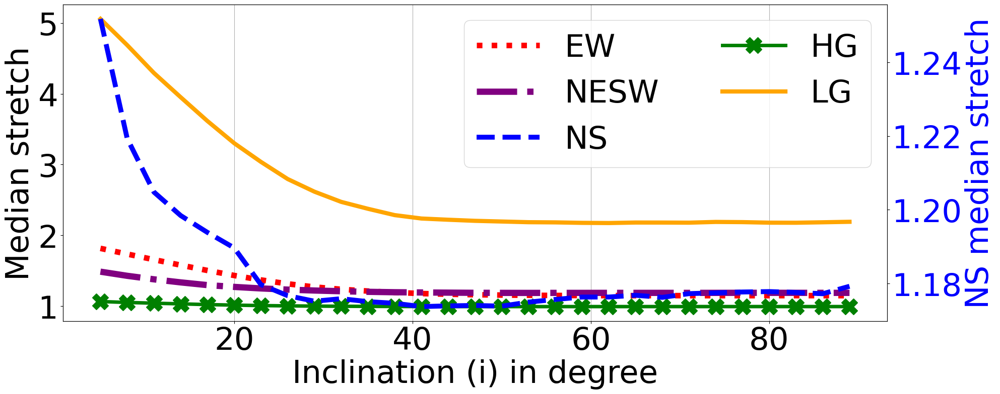

In [18]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_i')
print('TOP 100')
sth_i(GDPPOP_df)
print('Contry CAP')
sth_i(CONTRYCAP_df)
print('Flight')
sth_i(FLIGHT_df)


print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_i')
print('TOP 100')
sth_i(GDPPOP_df)
print('Country CAP')
sth_i(CONTRYCAP_df)
print('Flight')
sth_i(FLIGHT_df)


print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_i')
print('TOP 100')
sth_i(GDPPOP_df)
print('Contry CAP')
sth_i(CONTRYCAP_df)
print('Flight')
sth_i(FLIGHT_df)

Hop count across different GSes

Starlink
TOP 100


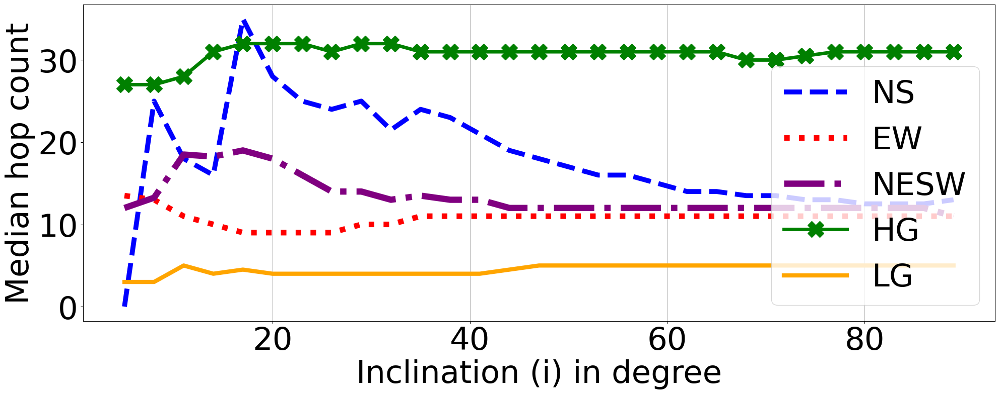

Contry CAP


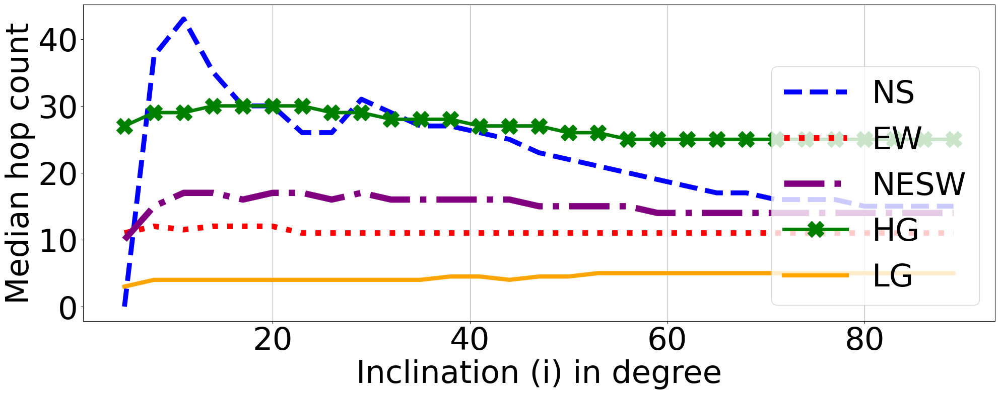

Flight


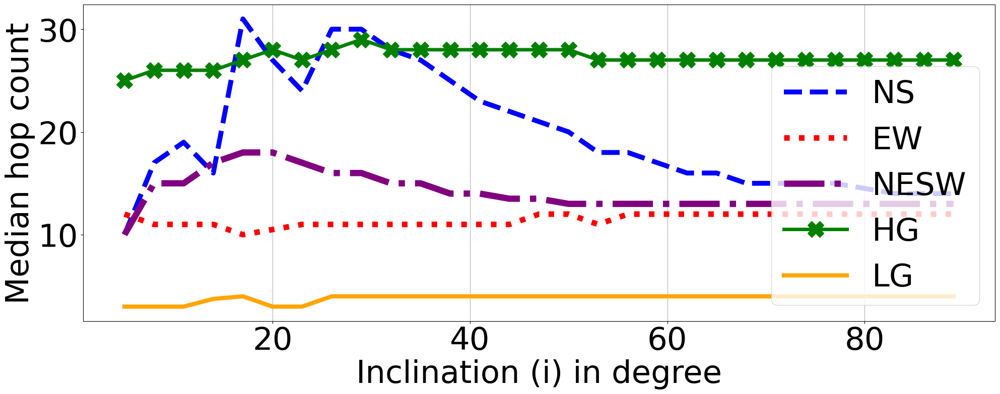

Kuiper
TOP 100


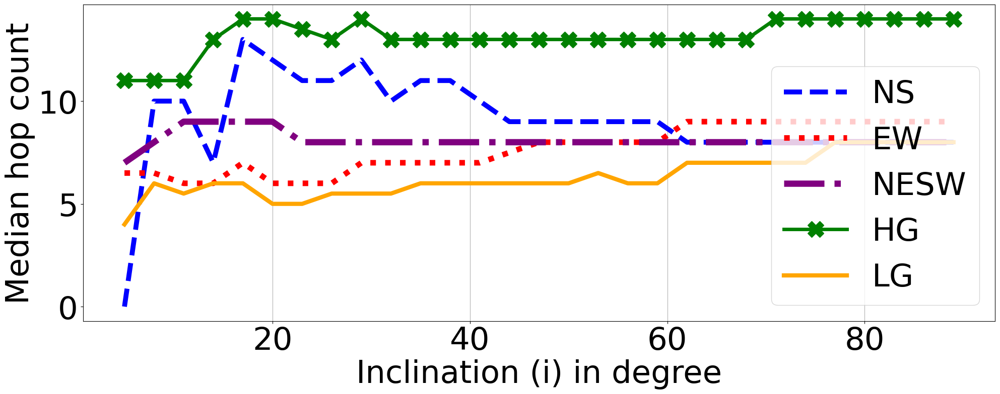

Country CAP


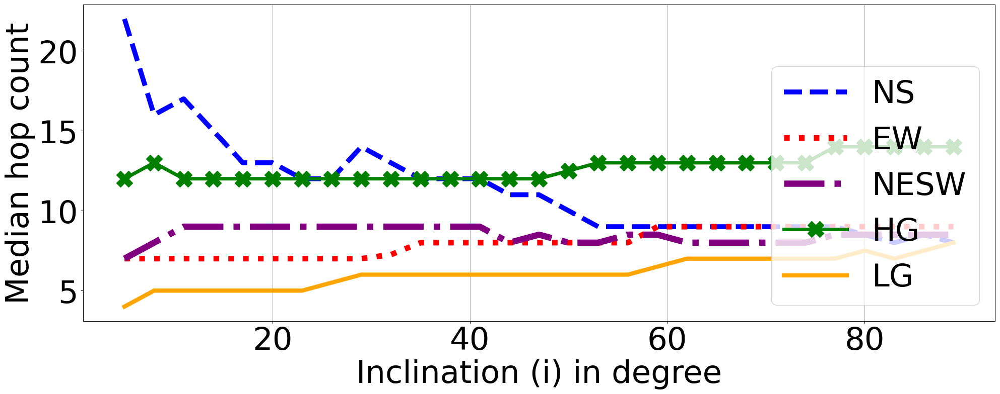

Flight


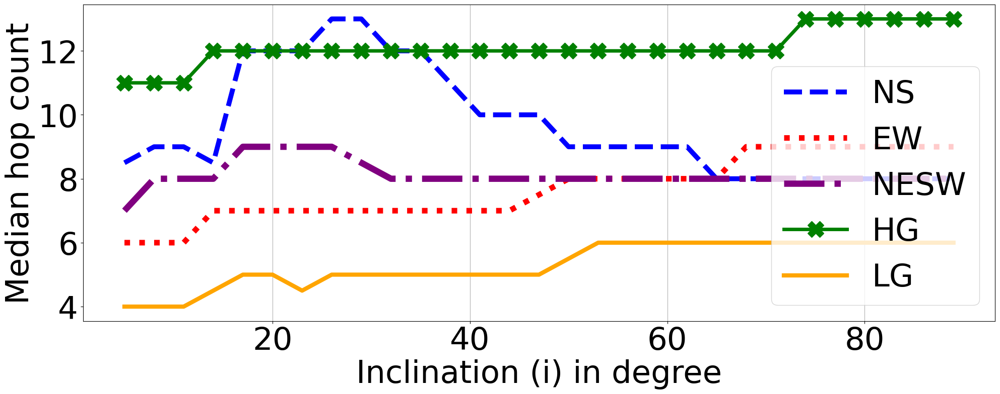

OneWeb
TOP 100


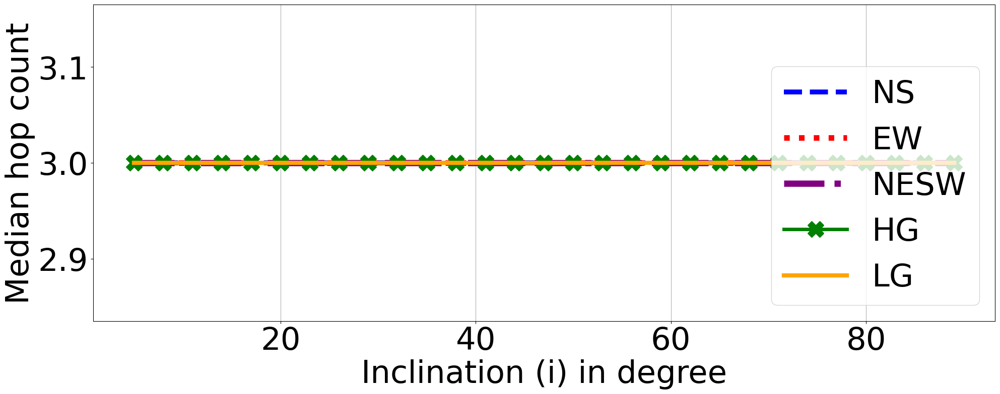

Contry CAP


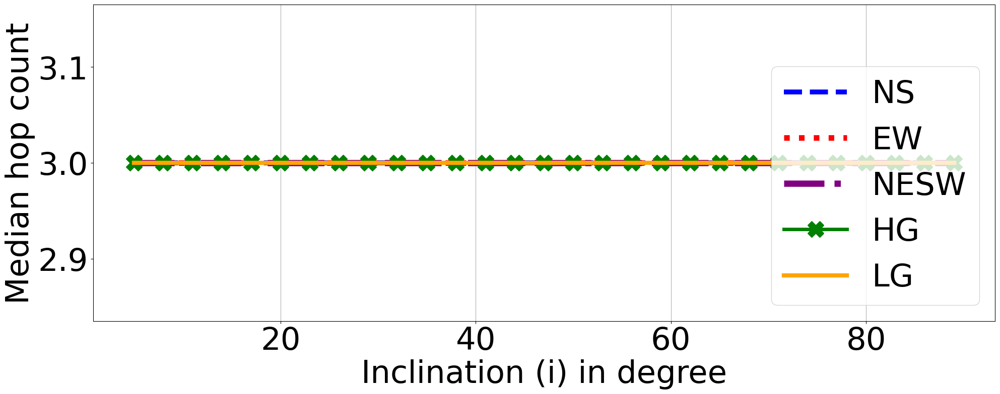

Flight


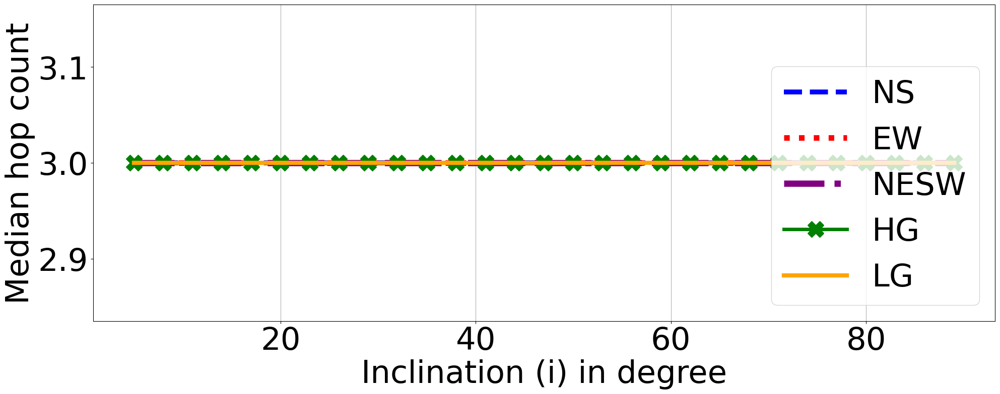

In [19]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_i')
print('TOP 100')
hop_i(GDPPOP_df)
print('Contry CAP')
hop_i(CONTRYCAP_df)
print('Flight')
hop_i(FLIGHT_df)


print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_i')
print('TOP 100')
hop_i(GDPPOP_df)
print('Country CAP')
hop_i(CONTRYCAP_df)
print('Flight')
hop_i(FLIGHT_df)


print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_i')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_i')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_i')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_i')
print('TOP 100')
hop_i(GDPPOP_df)
print('Contry CAP')
hop_i(CONTRYCAP_df)
print('Flight')
hop_i(FLIGHT_df)

## AoE (e)

In [20]:
starlink_5280_GDPPOP = '../with_ground_stations/POP_GDP_100/Starlink_Shell_1_5280/e_5_50.csv'
starlink_5280_ONLYPOP = '../with_ground_stations/TOP_POP_100/Starlink_Shell_1_5280/e_5_50.csv'
starlink_5280_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/Starlink_Shell_1_5280/e_5_50.csv'
starlink_5280_FLIGHT = '../with_flights/300Kbps/Starlink_Shell_1_5280/e_5_50.csv'

kuiper_784_GDPPOP = '../with_ground_stations/POP_GDP_100/Kuiper_Shell_3_784/e_5_50.csv'
kuiper_784_ONLYPOP = '../with_ground_stations/TOP_POP_100/Kuiper_Shell_3_784/e_5_50.csv'
kuiper_784_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/Kuiper_Shell_3_784/e_5_50.csv'
kuiper_784_FLIGHT = '../with_flights/300Kbps/Kuiper_Shell_3_784/e_5_50.csv'

oneweb_1764_GDPPOP = '../with_ground_stations/POP_GDP_100/OneWeb_Shell_1_1764/e_5_50.csv'
oneweb_1764_ONLYPOP = '../with_ground_stations/TOP_POP_100/OneWeb_Shell_1_1764/e_5_50.csv'
oneweb_1764_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/OneWeb_Shell_1_1764/e_5_50.csv'
oneweb_1764_FLIGHT = '../with_flights/300Kbps/OneWeb_Shell_1_1764/e_5_50.csv'

Throughput with different TMs

Starlink


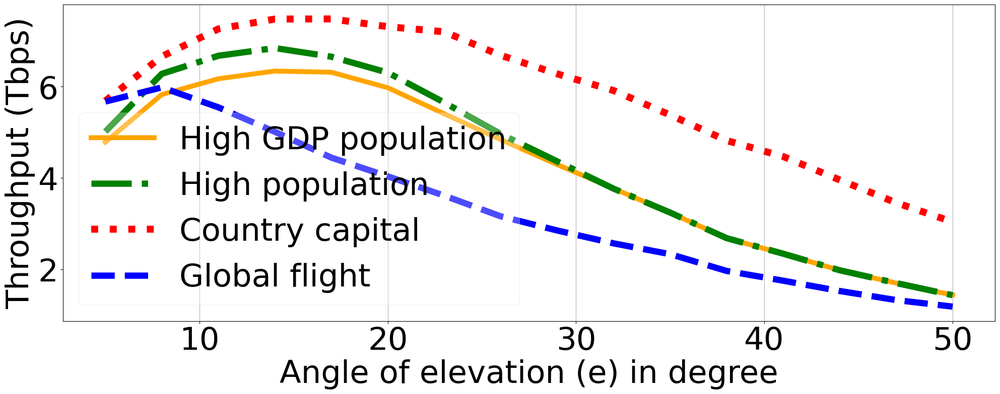

Kuiper


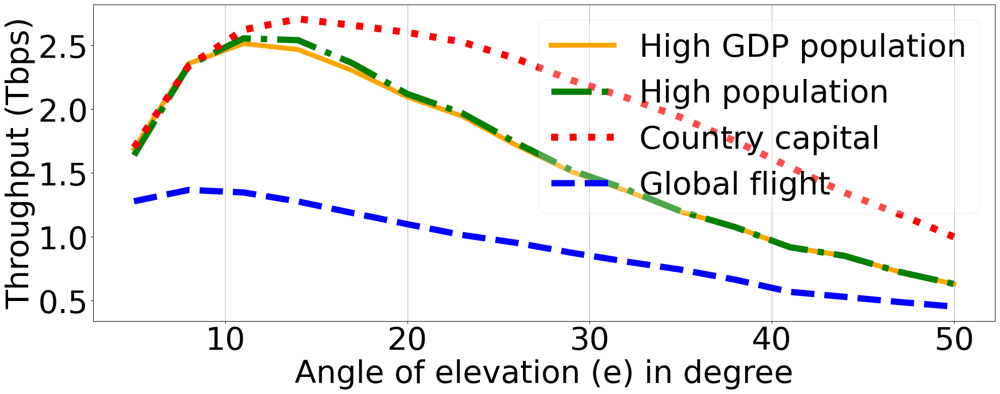

OneWeb


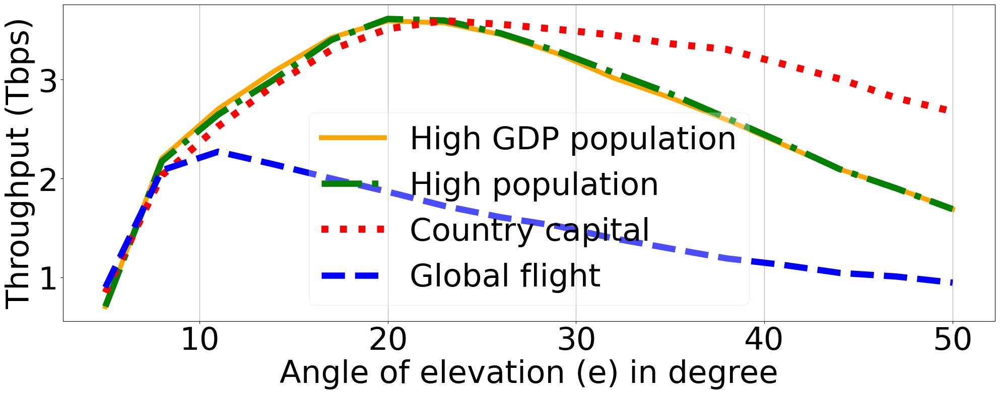

In [21]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_e')
plot_th('Angle of elevation (e) in degree', 'S0_e', GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df)

print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_e')
plot_th('Angle of elevation (e) in degree', 'S0_e',GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df)

print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_e')
plot_th('Angle of elevation (e) in degree', 'S0_e',GDPPOP_df, ONLYPOP_df, CONTRYCAP_df, FLIGHT_df)

Coverage with different GSes

Starlink


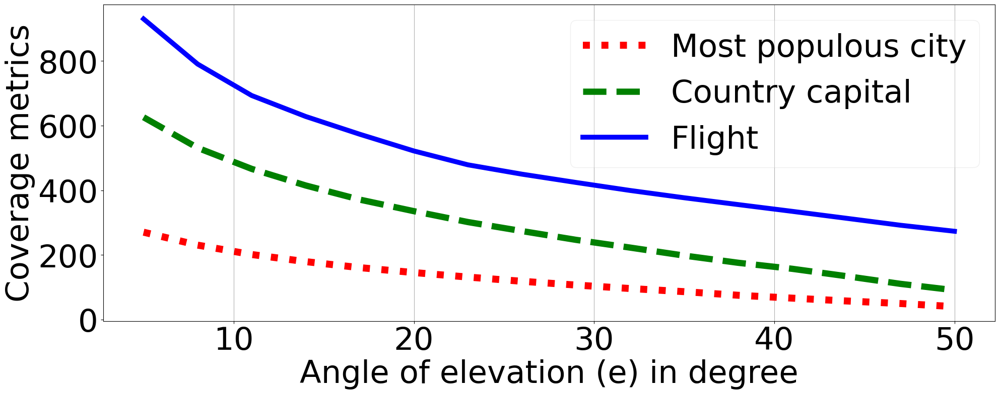

Kuiper


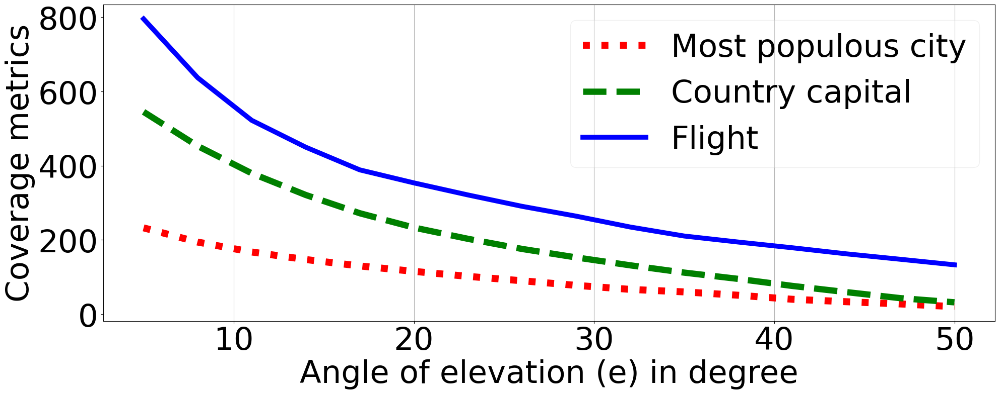

OneWeb


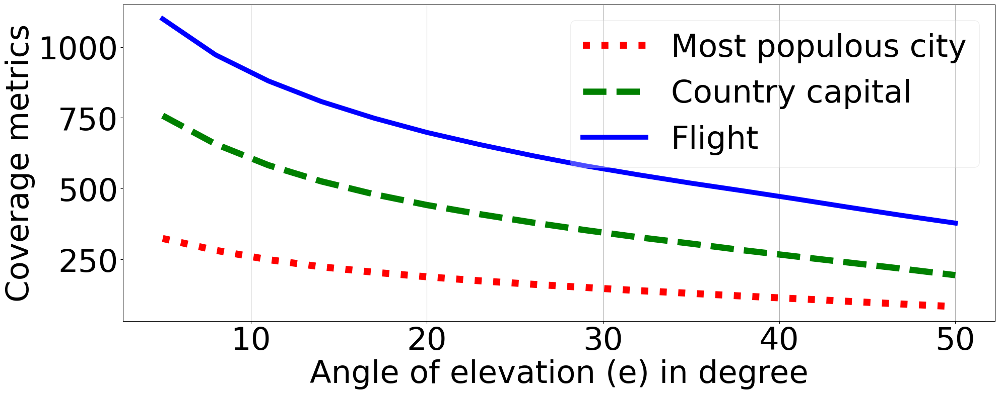

In [22]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_e')
plot_cov('Angle of elevation (e) in degree', 'S0_e',GDPPOP_df,CONTRYCAP_df,FLIGHT_df)


print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_e')
plot_cov('Angle of elevation (e) in degree', 'S0_e',GDPPOP_df,CONTRYCAP_df,FLIGHT_df)


print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_e')
plot_cov('Angle of elevation (e) in degree', 'S0_e',GDPPOP_df,CONTRYCAP_df,FLIGHT_df)

Stretch across different GSes

Starlink
TOP 100


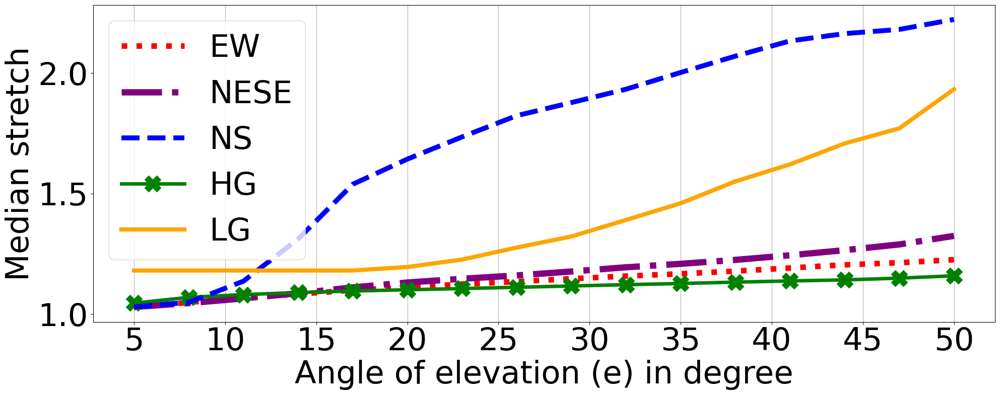

Contry CAP


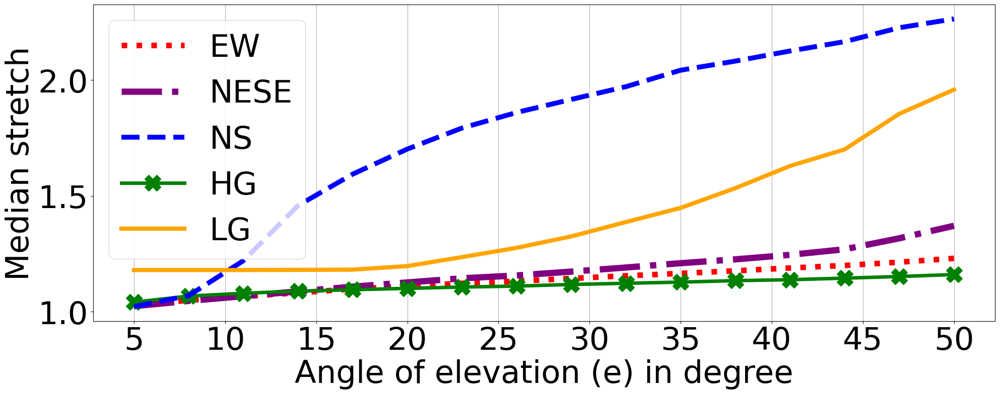

Flight


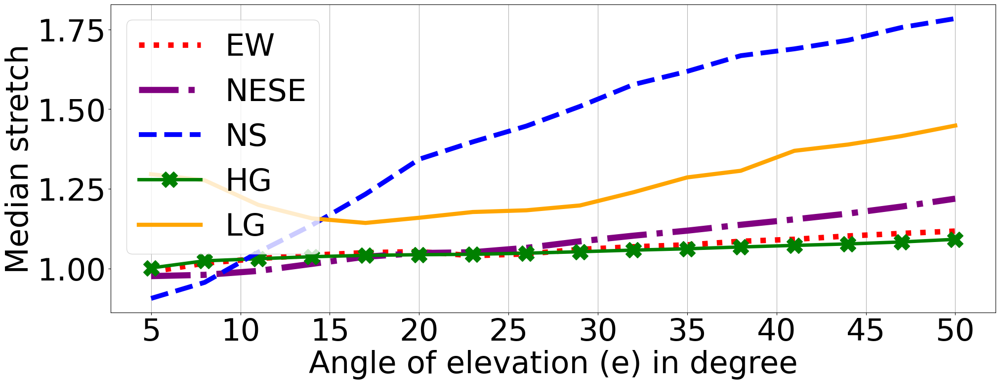

Kuiper
TOP 100


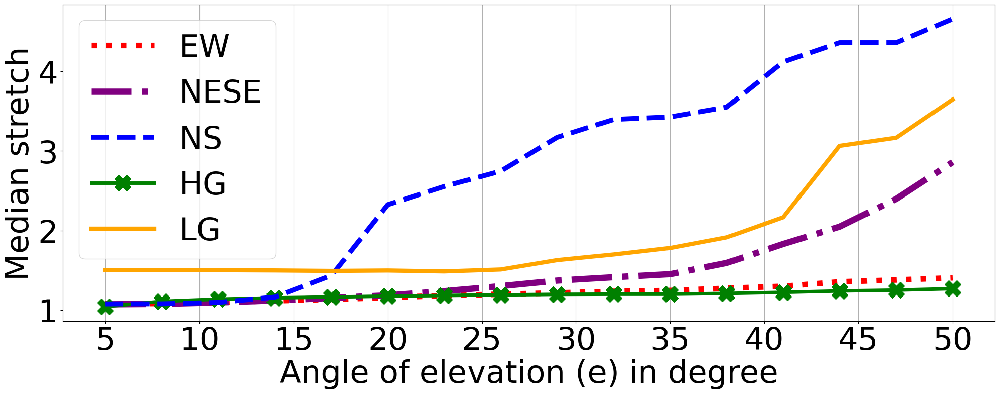

Country CAP


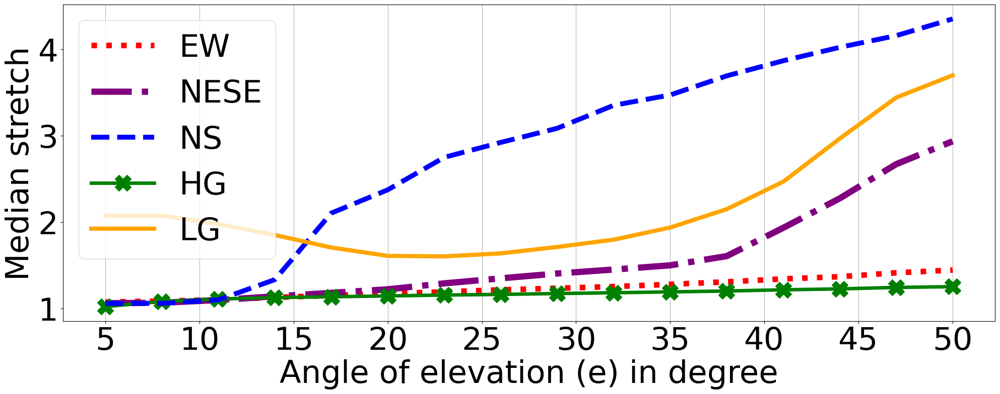

Flight


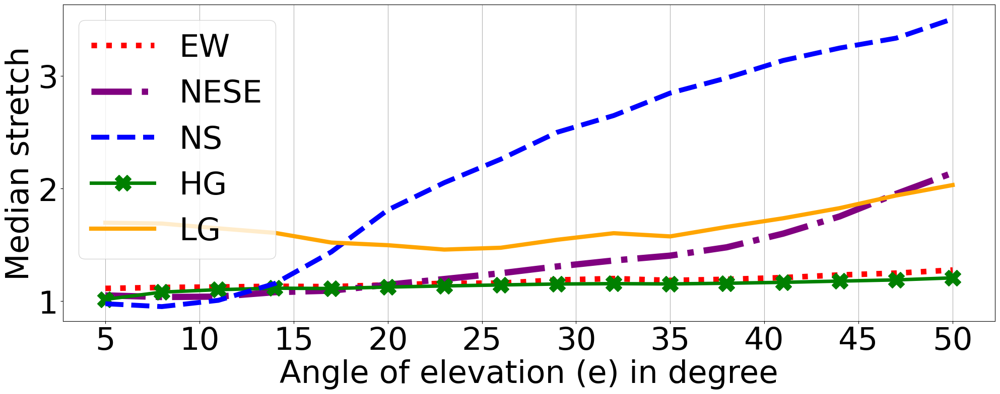

OneWeb
TOP 100


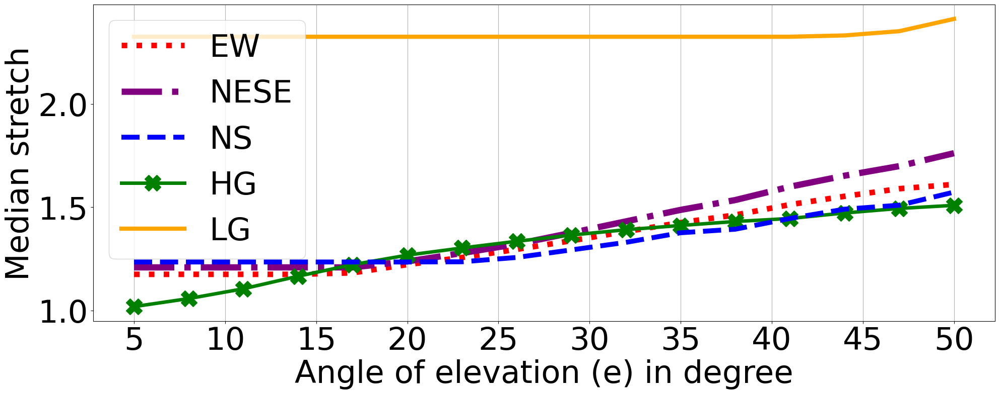

Contry CAP


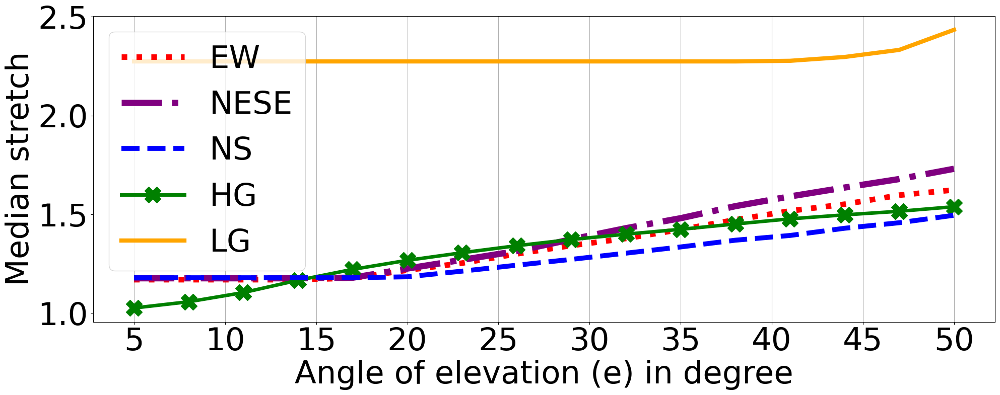

Flight


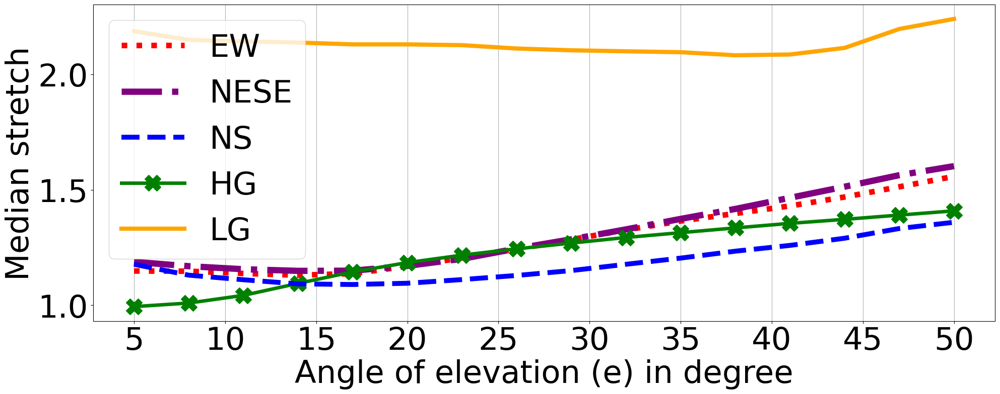

In [23]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_e')
print('TOP 100')
sth_e(GDPPOP_df)
print('Contry CAP')
sth_e(CONTRYCAP_df)
print('Flight')
sth_e(FLIGHT_df)


print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_e')
print('TOP 100')
sth_e(GDPPOP_df)
print('Country CAP')
sth_e(CONTRYCAP_df)
print('Flight')
sth_e(FLIGHT_df)


print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_e')
print('TOP 100')
sth_e(GDPPOP_df)
print('Contry CAP')
sth_e(CONTRYCAP_df)
print('Flight')
sth_e(FLIGHT_df)

Hop count across different GSes

Starlink
TOP 100


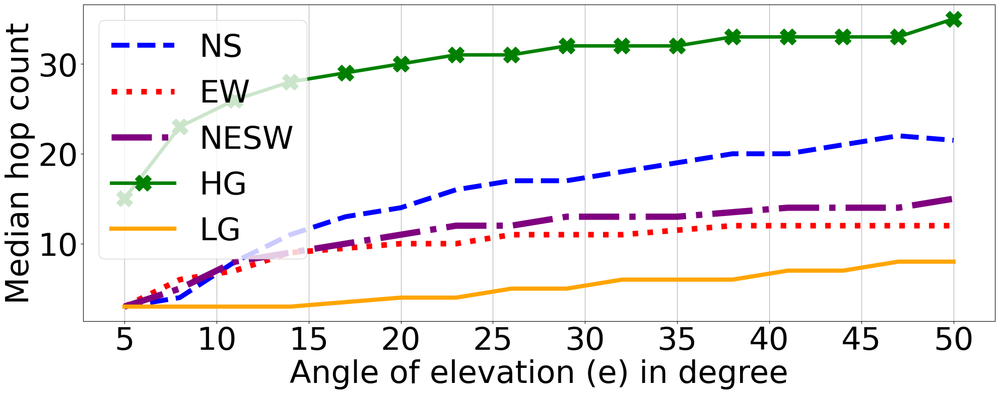

Contry CAP


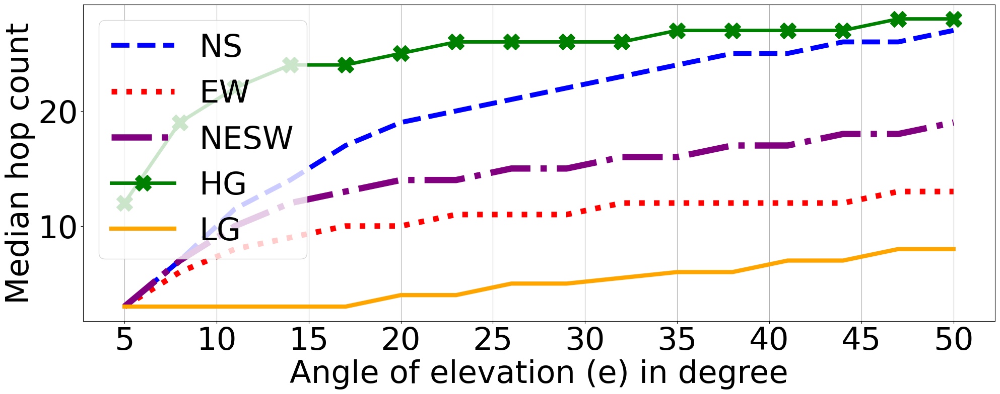

Flight


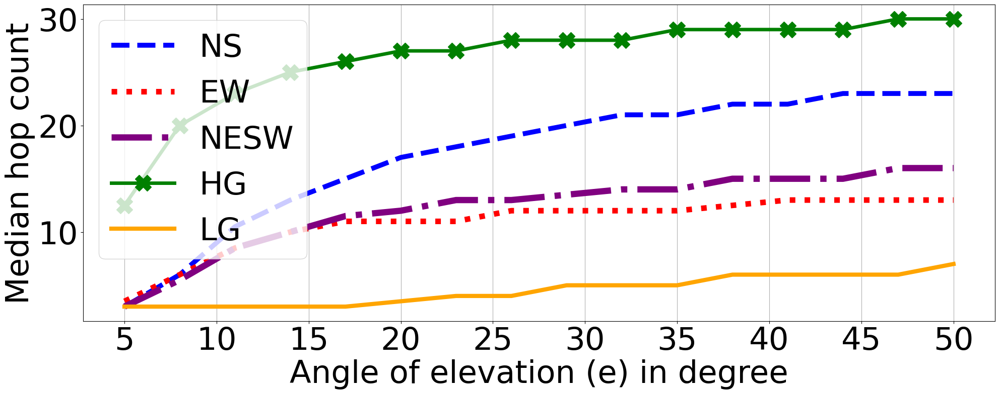

Kuiper
TOP 100


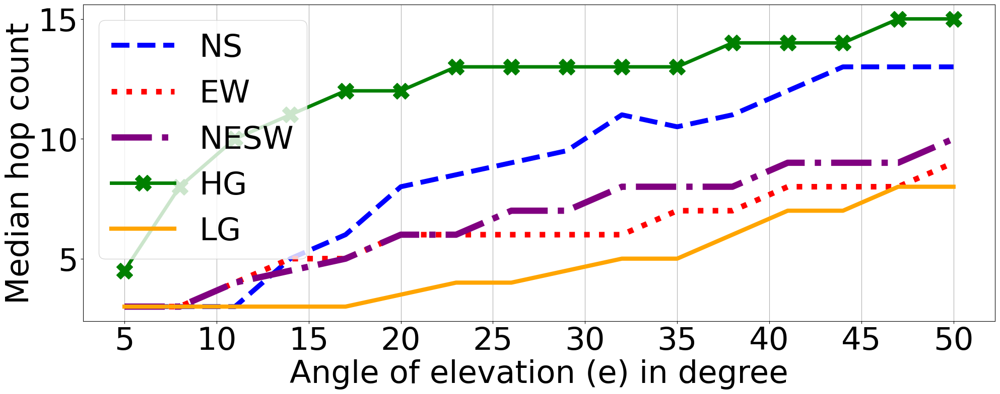

Country CAP


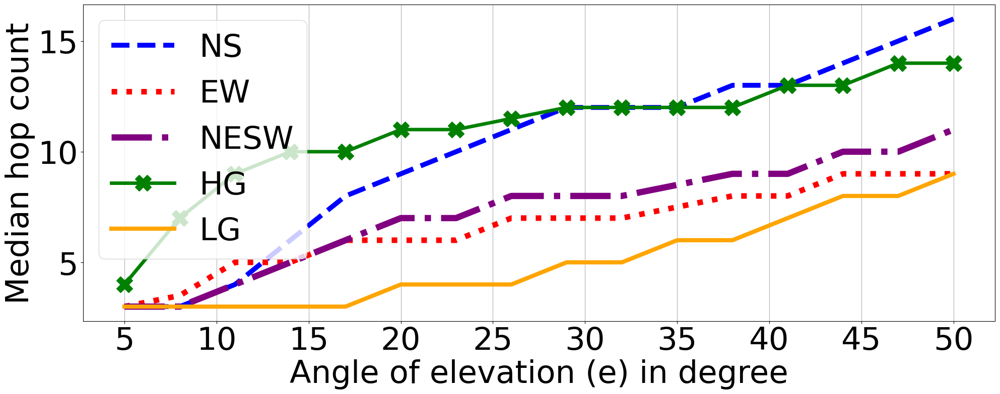

Flight


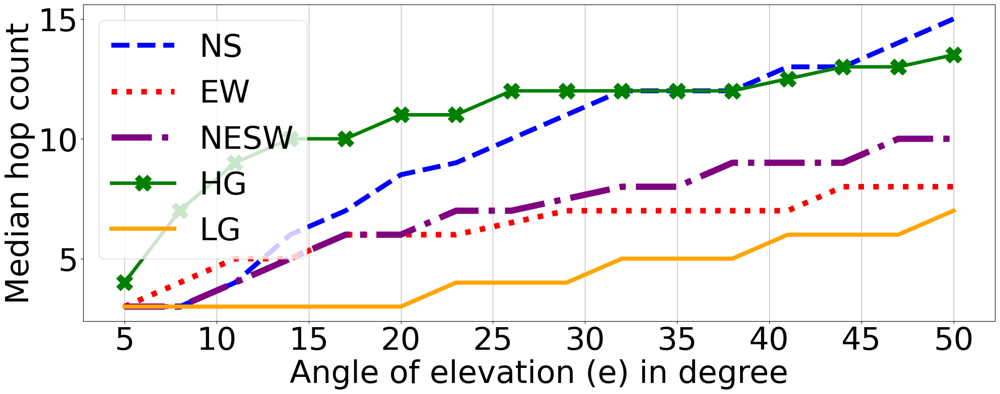

OneWeb
TOP 100


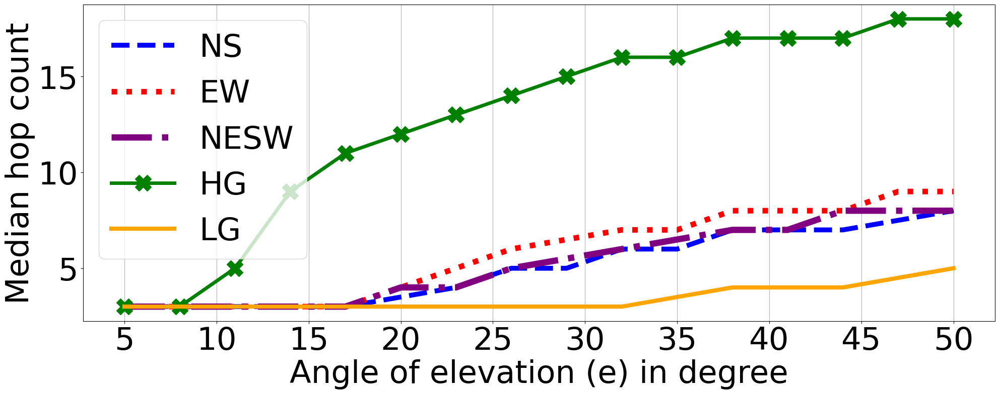

Contry CAP


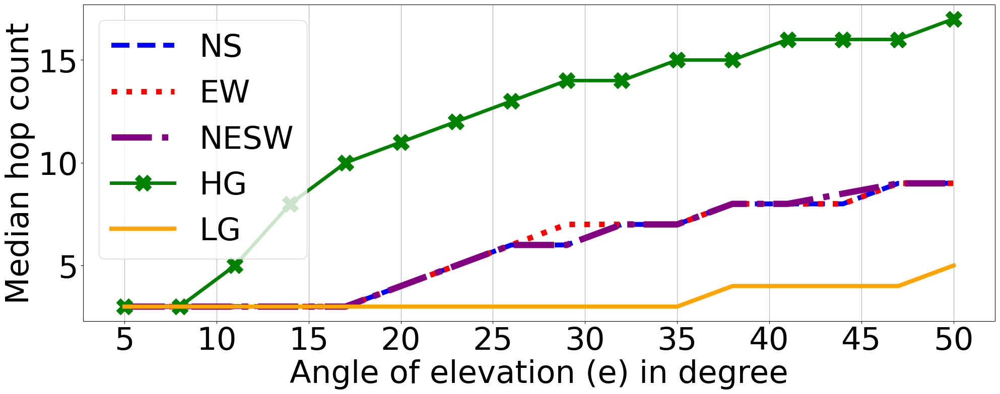

Flight


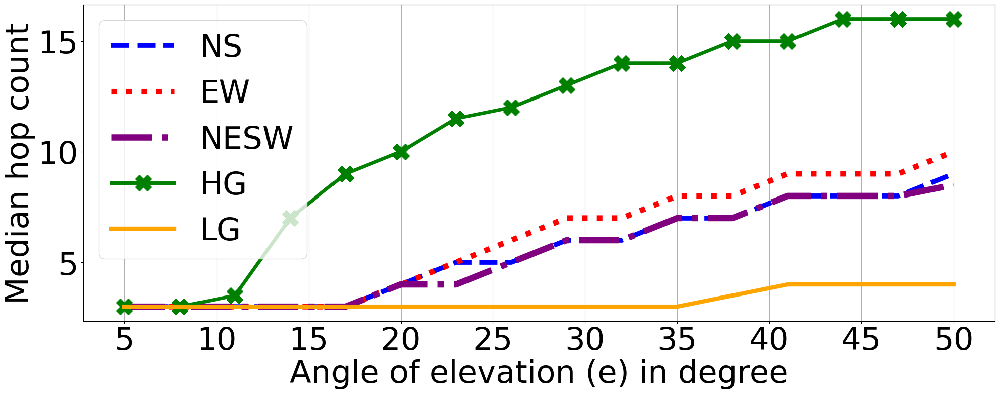

In [24]:
print('Starlink')
GDPPOP_df = pd.read_csv(starlink_5280_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(starlink_5280_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(starlink_5280_FLIGHT).sort_values(by='S0_e')
print('TOP 100')
hop_e(GDPPOP_df)
print('Contry CAP')
hop_e(CONTRYCAP_df)
print('Flight')
hop_e(FLIGHT_df)


print('Kuiper')
GDPPOP_df = pd.read_csv(kuiper_784_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(kuiper_784_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(kuiper_784_FLIGHT).sort_values(by='S0_e')
print('TOP 100')
hop_e(GDPPOP_df)
print('Country CAP')
hop_e(CONTRYCAP_df)
print('Flight')
hop_e(FLIGHT_df)


print('OneWeb')
GDPPOP_df = pd.read_csv(oneweb_1764_GDPPOP).sort_values(by='S0_e')
ONLYPOP_df = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_e')
CONTRYCAP_df = pd.read_csv(oneweb_1764_CONTRYCAP).sort_values(by='S0_e')
FLIGHT_df = pd.read_csv(oneweb_1764_FLIGHT).sort_values(by='S0_e')
print('TOP 100')
hop_e(GDPPOP_df)
print('Contry CAP')
hop_e(CONTRYCAP_df)
print('Flight')
hop_e(FLIGHT_df)

## View number of orbit (o) vs Phase offset (p)

In [25]:
starlink_5280_GDPPOP = '../with_ground_stations/POP_GDP_100/Starlink_Shell_1_5280/OXN_VS_P.csv'
starlink_5280_ONLYPOP = '../with_ground_stations/TOP_POP_100/Starlink_Shell_1_5280/OXN_VS_P.csv'
starlink_5280_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/Starlink_Shell_1_5280/OXN_VS_P.csv'
starlink_5280_FLIGHT = '../with_flights/300Kbps/Starlink_Shell_1_5280/OXN_VS_P.csv'

kuiper_784_GDPPOP = '../with_ground_stations/POP_GDP_100/Kuiper_Shell_3_784/OXN_VS_P.csv'
kuiper_784_ONLYPOP = '../with_ground_stations/TOP_POP_100/Kuiper_Shell_3_784/OXN_VS_P.csv'
kuiper_784_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/Kuiper_Shell_3_784/OXN_VS_P.csv'
kuiper_784_FLIGHT = '../with_flights/300Kbps/Kuiper_Shell_3_784/OXN_VS_P.csv'

oneweb_1764_GDPPOP = '../with_ground_stations/POP_GDP_100/OneWeb_Shell_1_1764/OXN_VS_P.csv'
oneweb_1764_ONLYPOP = '../with_ground_stations/TOP_POP_100/OneWeb_Shell_1_1764/OXN_VS_P.csv'
oneweb_1764_CONTRYCAP = '../with_ground_stations/ALL_COUNTRY_CAP/OneWeb_Shell_1_1764/OXN_VS_P.csv'
oneweb_1764_FLIGHT = '../with_flights/300Kbps/OneWeb_Shell_1_1764/OXN_VS_P.csv'

Starlink

In [26]:
def ovsp_starlink(df):
    o=12
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=3, alpha=0.3)

    o=30
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=4, alpha=0.4)

    o=60
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=5, alpha=0.5)

    o=110
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=6, alpha=0.6)

    o=264
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=7, alpha=0.7)

    o=330
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=11, alpha=0.8, c='g', linestyle='dashdot')

    o=352
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=12, alpha=0.9, c='b', linestyle='dashed')

    o=440
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=13, alpha=1, c='r', linestyle='dotted')


    plt.grid(axis = 'x')
    plt.xlabel('Phase-offset (p)')
    plt.ylabel('Throughput (Tbps)')
    plt.legend(ncol=2)
    plt.tight_layout()
    plt.show()

pop100


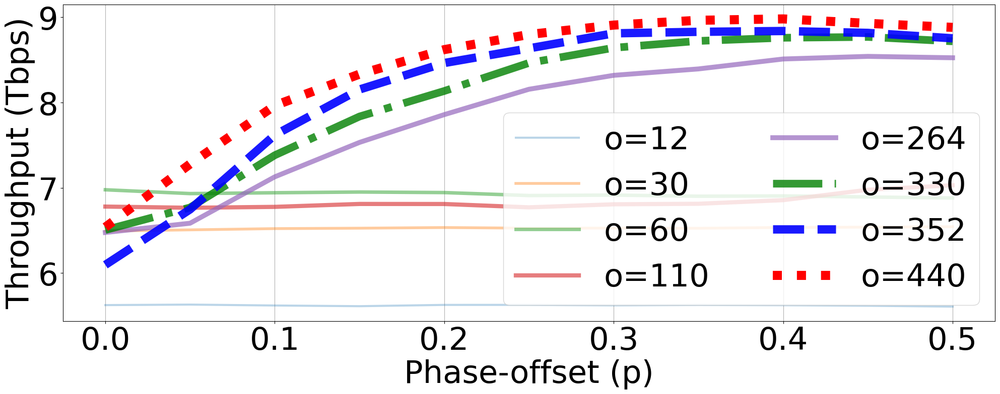

In [27]:
print('pop100')
df = pd.read_csv(starlink_5280_ONLYPOP)
df['throughput_Gbps'] = df['throughput_Gbps']/1000
df['S0_p'] = df['S0_p']/100

# sorted(df['S0_o'].unique())
ovsp_starlink(df)

cap


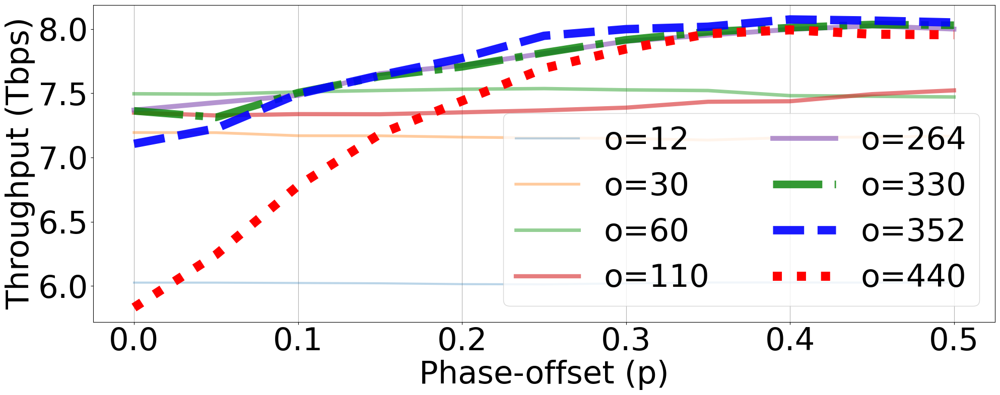

In [28]:
print('cap')
df = pd.read_csv(starlink_5280_CONTRYCAP)
df['throughput_Gbps'] = df['throughput_Gbps']/1000
df['S0_p'] = df['S0_p']/100

# sorted(df['S0_o'].unique())
ovsp_starlink(df)

fly


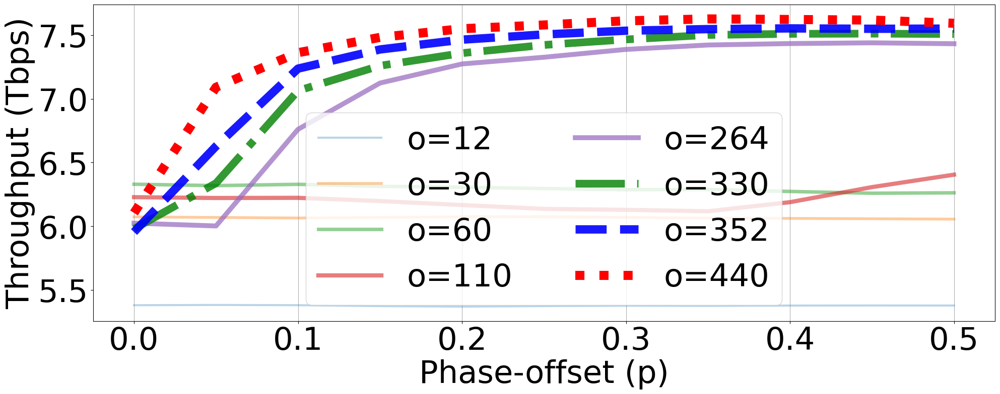

In [29]:
print('fly')
df = pd.read_csv(starlink_5280_FLIGHT)
df['throughput_Gbps'] = df['throughput_Gbps']/1000
df['S0_p'] = df['S0_p']/100

# sorted(df['S0_o'].unique())
ovsp_starlink(df)

Kuiper

In [30]:
def ovsp_kuiper(df):
    o=14
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=6, alpha=0.6)

    o=16
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=7, alpha=0.7)

    o=28
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=11, alpha=0.8, c='g', linestyle='dashdot')

    o=49
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=12, alpha=0.9, c='b', linestyle='dashed')

    o=56
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=13, alpha=1, c='r', linestyle='dotted')


    plt.grid(axis = 'x')
    plt.xlabel('Phase-offset (p)')
    plt.ylabel('Throughput (Tbps)')
    plt.legend(ncol=2)
    plt.tight_layout()
    plt.show()

pop100


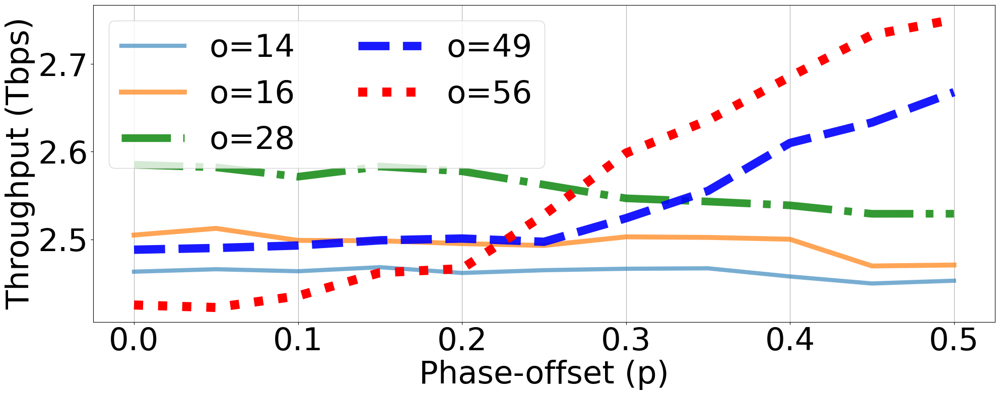

In [31]:
print('pop100')
df = pd.read_csv(kuiper_784_ONLYPOP)
df['throughput_Gbps'] = df['throughput_Gbps']/1000
df['S0_p'] = df['S0_p']/100

# sorted(df['S0_o'].unique())
ovsp_kuiper(df)

cap


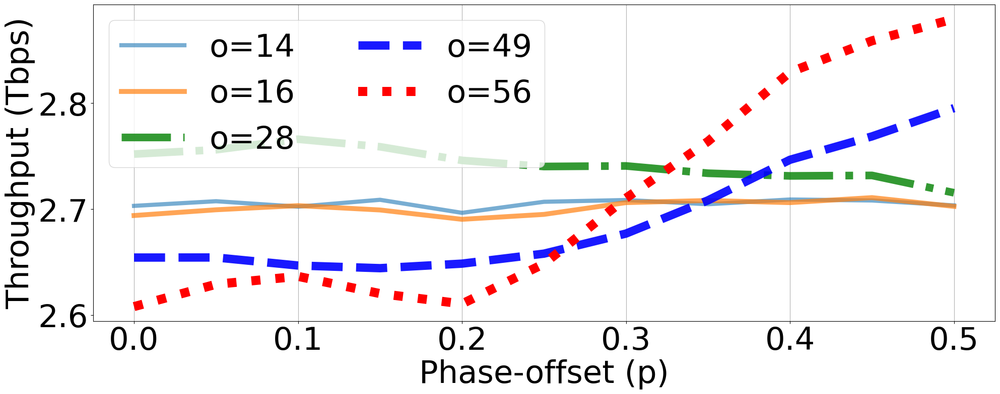

In [32]:
print('cap')
df = pd.read_csv(kuiper_784_CONTRYCAP)
df['throughput_Gbps'] = df['throughput_Gbps']/1000
df['S0_p'] = df['S0_p']/100

# sorted(df['S0_o'].unique())
ovsp_kuiper(df)

fly


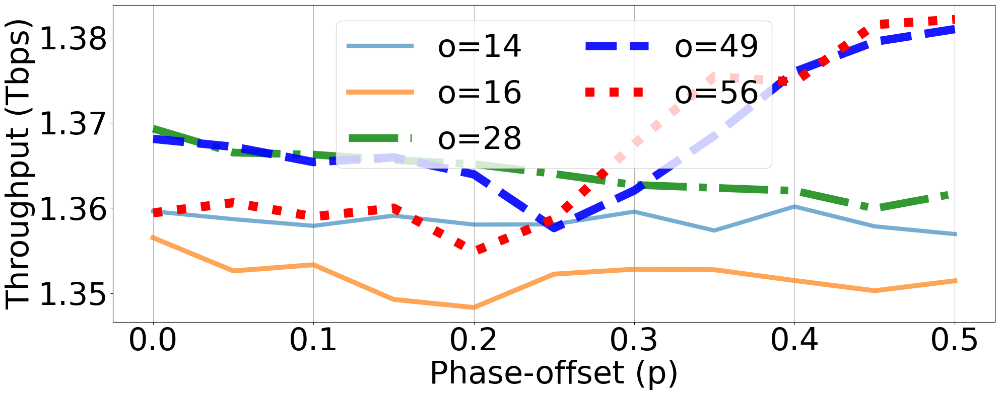

In [33]:
print('fly')
df = pd.read_csv(kuiper_784_FLIGHT)
df['throughput_Gbps'] = df['throughput_Gbps']/1000
df['S0_p'] = df['S0_p']/100

# sorted(df['S0_o'].unique())
ovsp_kuiper(df)

OneWeb

In [34]:
def ovsp_oneweb(df):
    o=12
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=3, alpha=0.3)

    o=18
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=4, alpha=0.4)

    o=28
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=5, alpha=0.5)

    o=42
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=6, alpha=0.6)

    o=84
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=7, alpha=0.7)

    o=98
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=11, alpha=0.8, c='g', linestyle='dashdot')

    o=126
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=12, alpha=0.9, c='b', linestyle='dashed')

    o=147
    df_by_o = df.loc[df['S0_o'] == o].sort_values(by='S0_p')
    plt.plot(df_by_o['S0_p'], df_by_o['throughput_Gbps'], label=f'o={o}', linewidth=13, alpha=1, c='r', linestyle='dotted')


    plt.grid(axis = 'x')
    plt.xlabel('Phase-offset (p)')
    plt.ylabel('Throughput (Tbps)')
    plt.legend(ncol=2)
    plt.tight_layout()
    plt.show()

pop100


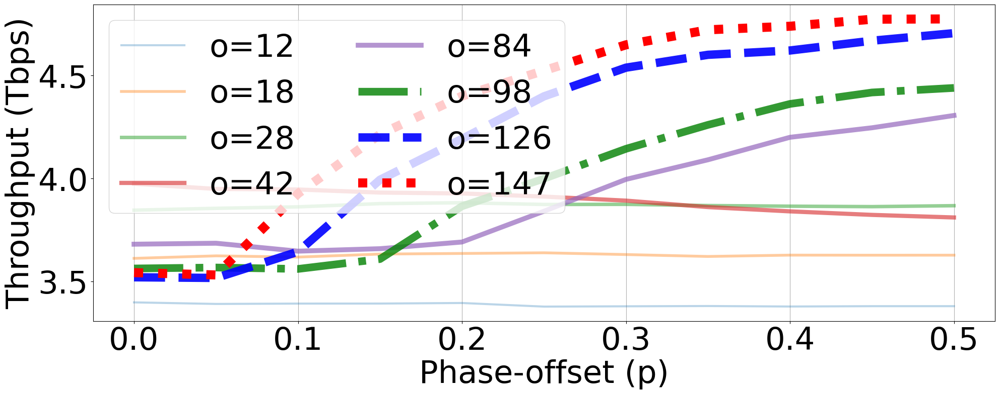

In [35]:
print('pop100')
df = pd.read_csv(oneweb_1764_ONLYPOP)
df['throughput_Gbps'] = df['throughput_Gbps']/1000
df['S0_p'] = df['S0_p']/100

# sorted(df['S0_o'].unique())
ovsp_oneweb(df)

cap


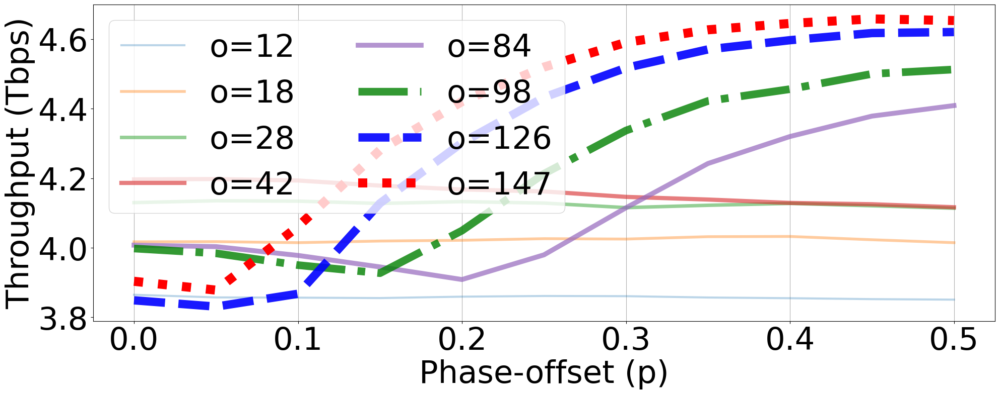

In [36]:
print('cap')
df = pd.read_csv(oneweb_1764_CONTRYCAP)
df['throughput_Gbps'] = df['throughput_Gbps']/1000
df['S0_p'] = df['S0_p']/100

# sorted(df['S0_o'].unique())
ovsp_oneweb(df)

fly


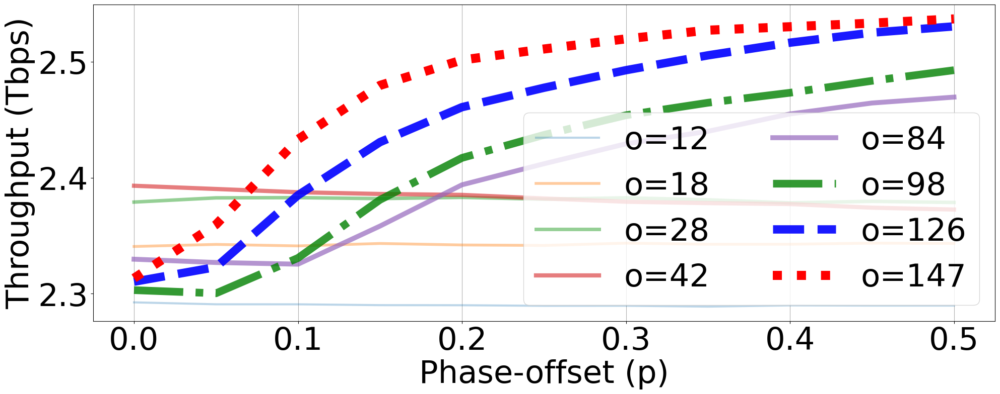

In [37]:
print('fly')
df = pd.read_csv(oneweb_1764_FLIGHT)
df['throughput_Gbps'] = df['throughput_Gbps']/1000
df['S0_p'] = df['S0_p']/100

# sorted(df['S0_o'].unique())
ovsp_oneweb(df)

# Shortlisted plots for the paper

## Altitude h

In [38]:
starlink_5280_ONLYPOP = '../with_ground_stations/TOP_POP_100/Starlink_Shell_1_5280/h_300_2000.csv'
kuiper_784_ONLYPOP = '../with_ground_stations/TOP_POP_100/Kuiper_Shell_3_784/h_300_2000.csv'
oneweb_1764_ONLYPOP = '../with_ground_stations/TOP_POP_100/OneWeb_Shell_1_1764/h_300_2000.csv'


starlink_5280_ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_h_km')
kuiper_784_ONLYPOP = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_h_km')
oneweb_1764_ONLYPOP = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_h_km')

starlink_5280_ONLYPOP_df['throughput_Gbps'] = starlink_5280_ONLYPOP_df['throughput_Gbps']/1000
kuiper_784_ONLYPOP['throughput_Gbps'] = kuiper_784_ONLYPOP['throughput_Gbps']/1000
oneweb_1764_ONLYPOP['throughput_Gbps'] = oneweb_1764_ONLYPOP['throughput_Gbps']/1000

Throughput

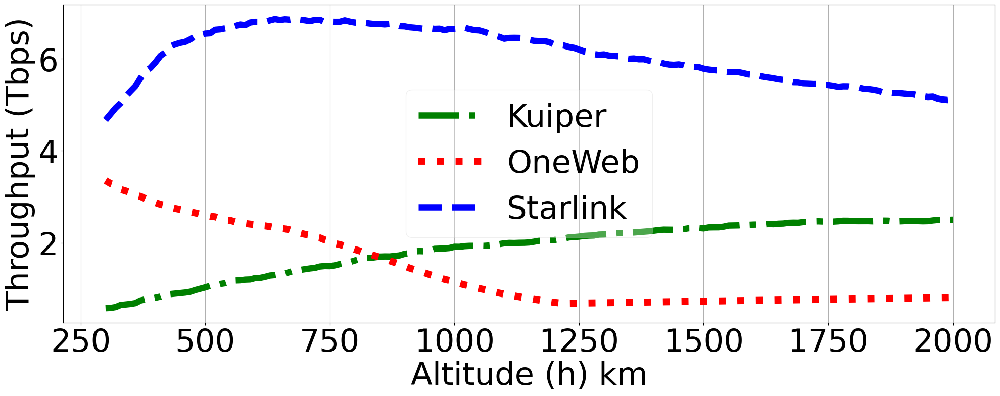

In [39]:
xlabel = 'Altitude (h) km'
xaxis = 'S0_h_km'
 
fig, ax1 = plt.subplots()
# ax1.set_xticks(x_label_ticks, minor=False)
ax1.xaxis.grid(True, which='major')
ax1.xaxis.grid(True, which='minor')
ax1.tick_params(axis='y')
ax1.set_xlabel(xlabel)
ax1.set_ylabel('Throughput (Tbps)')


ax1.plot(kuiper_784_ONLYPOP[xaxis], kuiper_784_ONLYPOP['throughput_Gbps'], label='Kuiper', color='g', linewidth=9, linestyle='dashdot')
ax1.plot(oneweb_1764_ONLYPOP[xaxis], oneweb_1764_ONLYPOP['throughput_Gbps'], label='OneWeb', color='r', linewidth=10, linestyle='dotted')
ax1.plot(starlink_5280_ONLYPOP_df[xaxis], starlink_5280_ONLYPOP_df['throughput_Gbps'], label='Starlink', color='b', linewidth=9, linestyle='dashed')


ax1.legend(framealpha=0.3)
plt.tight_layout()
plt.show()

Coverage

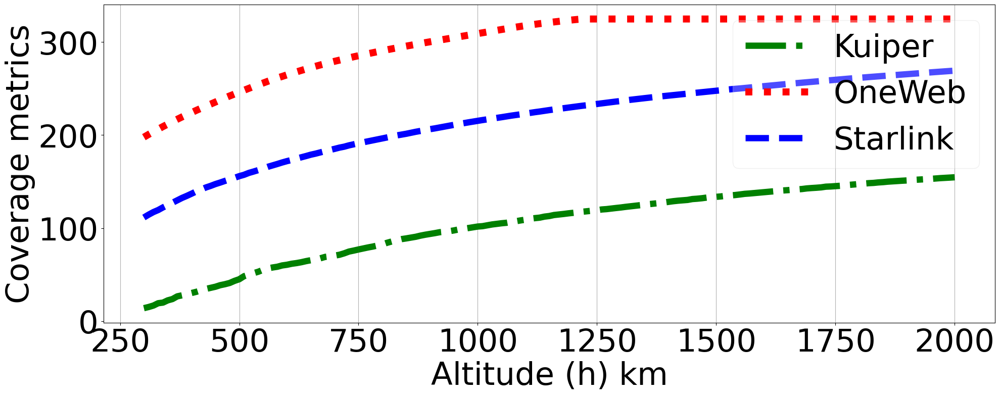

In [40]:
fig, ax1 = plt.subplots()
# ax1.set_xticks(x_label_ticks, minor=False)
ax1.xaxis.grid(True, which='major')
ax1.xaxis.grid(True, which='minor')
ax1.tick_params(axis='y')
ax1.set_xlabel(xlabel)
ax1.set_ylabel('Coverage metrics')


ax1.plot(kuiper_784_ONLYPOP[xaxis], kuiper_784_ONLYPOP['GS_coverage_metric'], label='Kuiper', color='g', linewidth=9, linestyle='dashdot')
ax1.plot(oneweb_1764_ONLYPOP[xaxis], oneweb_1764_ONLYPOP['GS_coverage_metric'], label='OneWeb', color='r', linewidth=10, linestyle='dotted')
ax1.plot(starlink_5280_ONLYPOP_df[xaxis], starlink_5280_ONLYPOP_df['GS_coverage_metric'], label='Starlink', color='b', linewidth=9, linestyle='dashed')


ax1.legend(framealpha=0.3)
plt.tight_layout()
plt.show()

## Inclination i

In [41]:
starlink_5280_ONLYPOP = '../with_ground_stations/TOP_POP_100/Starlink_Shell_1_5280/i_5_90.csv'
kuiper_784_ONLYPOP = '../with_ground_stations/TOP_POP_100/Kuiper_Shell_3_784/i_5_90.csv'
oneweb_1764_ONLYPOP = '../with_ground_stations/TOP_POP_100/OneWeb_Shell_1_1764/i_5_90.csv'

starlink_5280_ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_i')
kuiper_784_ONLYPOP = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_i')
oneweb_1764_ONLYPOP = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_i')

starlink_5280_ONLYPOP_df['throughput_Gbps'] = starlink_5280_ONLYPOP_df['throughput_Gbps']/1000
kuiper_784_ONLYPOP['throughput_Gbps'] = kuiper_784_ONLYPOP['throughput_Gbps']/1000
oneweb_1764_ONLYPOP['throughput_Gbps'] = oneweb_1764_ONLYPOP['throughput_Gbps']/1000

Throughput

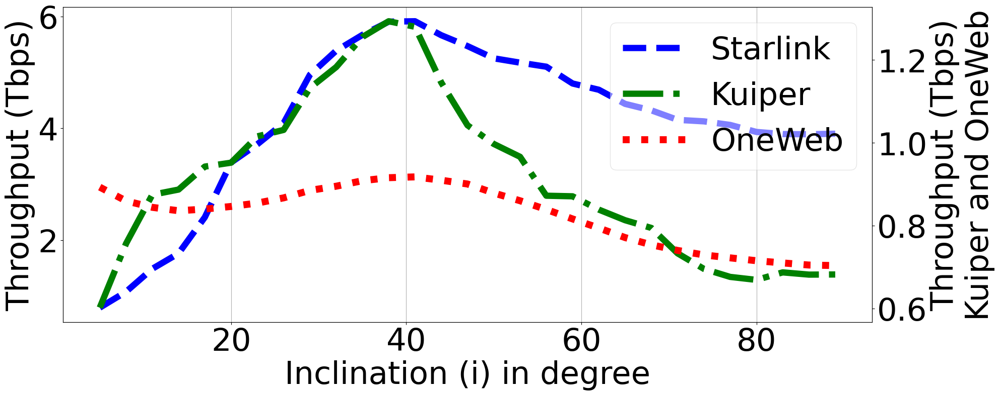

In [42]:
xlabel = 'Inclination (i) in degree'
xaxis = 'S0_i'
 
fig, ax1 = plt.subplots()
# ax1.set_xticks(x_label_ticks, minor=False)
ax1.xaxis.grid(True, which='major')
ax1.xaxis.grid(True, which='minor')
ax1.tick_params(axis='y')
ax1.set_xlabel(xlabel)
ax1.set_ylabel('Throughput (Tbps)')


line1 = ax1.plot(starlink_5280_ONLYPOP_df[xaxis], starlink_5280_ONLYPOP_df['throughput_Gbps'], label='Starlink', color='b', linewidth=9, linestyle='dashed')

ax2 = ax1.twinx()
ax2.set_ylabel('Throughput (Tbps)\nKuiper and OneWeb')
line2 = ax2.plot(kuiper_784_ONLYPOP[xaxis], kuiper_784_ONLYPOP['throughput_Gbps'], label='Kuiper', color='g', linewidth=9, linestyle='dashdot')
line3 = ax2.plot(oneweb_1764_ONLYPOP[xaxis], oneweb_1764_ONLYPOP['throughput_Gbps'], label='OneWeb', color='r', linewidth=10, linestyle='dotted')


lines = line1+line2+line3
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, framealpha=0.5, ncol=1, loc=1)
plt.tight_layout()
plt.show()

Coverage

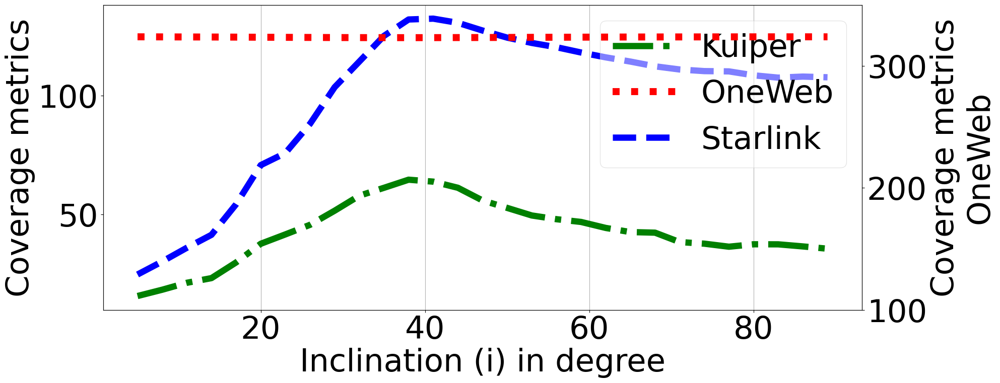

In [43]:
fig, ax1 = plt.subplots()
# ax1.set_xticks(x_label_ticks, minor=False)
ax1.xaxis.grid(True, which='major')
ax1.xaxis.grid(True, which='minor')
ax1.tick_params(axis='y')
ax1.set_xlabel(xlabel)
ax1.set_ylabel('Coverage metrics')


line1 = ax1.plot(kuiper_784_ONLYPOP[xaxis], kuiper_784_ONLYPOP['GS_coverage_metric'], label='Kuiper', color='g', linewidth=9, linestyle='dashdot')
line3 = ax1.plot(starlink_5280_ONLYPOP_df[xaxis], starlink_5280_ONLYPOP_df['GS_coverage_metric'], label='Starlink', color='b', linewidth=9, linestyle='dashed')

ax2 = ax1.twinx()
ax2.set_ylabel('Coverage metrics\nOneWeb')
ax2.set_ylim(100, 350)
line2 = ax2.plot(oneweb_1764_ONLYPOP[xaxis], oneweb_1764_ONLYPOP['GS_coverage_metric'], label='OneWeb', color='r', linewidth=10, linestyle='dotted')

lines = line1+line2+line3
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, framealpha=0.5, ncol=1, loc=1)
plt.tight_layout()
plt.show()

## Elevation e

In [44]:
starlink_5280_ONLYPOP = '../with_ground_stations/TOP_POP_100/Starlink_Shell_1_5280/e_5_50.csv'
kuiper_784_ONLYPOP = '../with_ground_stations/TOP_POP_100/Kuiper_Shell_3_784/e_5_50.csv'
oneweb_1764_ONLYPOP = '../with_ground_stations/TOP_POP_100/OneWeb_Shell_1_1764/e_5_50.csv'

starlink_5280_ONLYPOP_df = pd.read_csv(starlink_5280_ONLYPOP).sort_values(by='S0_e')
kuiper_784_ONLYPOP = pd.read_csv(kuiper_784_ONLYPOP).sort_values(by='S0_e')
oneweb_1764_ONLYPOP = pd.read_csv(oneweb_1764_ONLYPOP).sort_values(by='S0_e')

starlink_5280_ONLYPOP_df['throughput_Gbps'] = starlink_5280_ONLYPOP_df['throughput_Gbps']/1000
kuiper_784_ONLYPOP['throughput_Gbps'] = kuiper_784_ONLYPOP['throughput_Gbps']/1000
oneweb_1764_ONLYPOP['throughput_Gbps'] = oneweb_1764_ONLYPOP['throughput_Gbps']/1000

Throughput

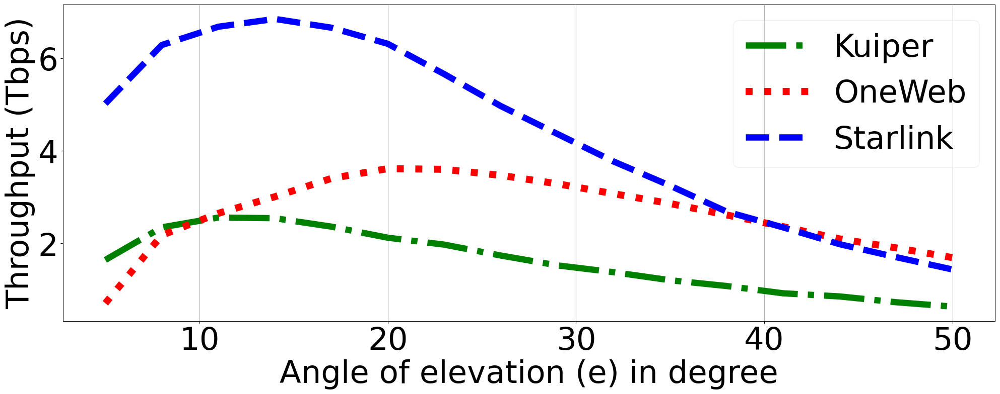

In [45]:
xlabel = 'Angle of elevation (e) in degree'
xaxis = 'S0_e'
 
fig, ax1 = plt.subplots()
# ax1.set_xticks(x_label_ticks, minor=False)
ax1.xaxis.grid(True, which='major')
ax1.xaxis.grid(True, which='minor')
ax1.tick_params(axis='y')
ax1.set_xlabel(xlabel)
ax1.set_ylabel('Throughput (Tbps)')


ax1.plot(kuiper_784_ONLYPOP[xaxis], kuiper_784_ONLYPOP['throughput_Gbps'], label='Kuiper', color='g', linewidth=9, linestyle='dashdot')
ax1.plot(oneweb_1764_ONLYPOP[xaxis], oneweb_1764_ONLYPOP['throughput_Gbps'], label='OneWeb', color='r', linewidth=10, linestyle='dotted')
ax1.plot(starlink_5280_ONLYPOP_df[xaxis], starlink_5280_ONLYPOP_df['throughput_Gbps'], label='Starlink', color='b', linewidth=9, linestyle='dashed')


ax1.legend(framealpha=0.3)
plt.tight_layout()
plt.show()

Coverage

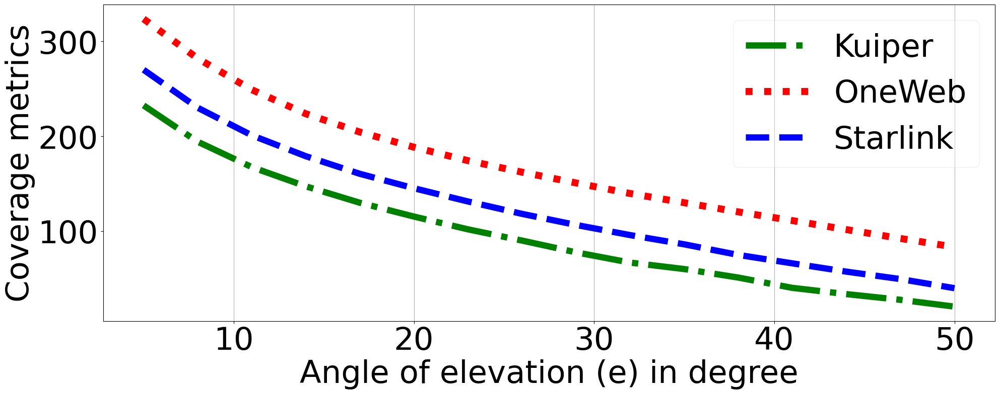

In [46]:
fig, ax1 = plt.subplots()
# ax1.set_xticks(x_label_ticks, minor=False)
ax1.xaxis.grid(True, which='major')
ax1.xaxis.grid(True, which='minor')
ax1.tick_params(axis='y')
ax1.set_xlabel(xlabel)
ax1.set_ylabel('Coverage metrics')


ax1.plot(kuiper_784_ONLYPOP[xaxis], kuiper_784_ONLYPOP['GS_coverage_metric'], label='Kuiper', color='g', linewidth=9, linestyle='dashdot')
ax1.plot(oneweb_1764_ONLYPOP[xaxis], oneweb_1764_ONLYPOP['GS_coverage_metric'], label='OneWeb', color='r', linewidth=10, linestyle='dotted')
ax1.plot(starlink_5280_ONLYPOP_df[xaxis], starlink_5280_ONLYPOP_df['GS_coverage_metric'], label='Starlink', color='b', linewidth=9, linestyle='dashed')


ax1.legend(framealpha=0.3)
plt.tight_layout()
plt.show()